#Research Report
#Nucleus segmentation via artificial neural network

In the context of microscopy cell imaging analyses, the identification of a cell nuclei is often described as a critical step. Recent developments in Deep Learning have optimized this operation compared to previous rule-based algorithms.   

A common machine learning based method for solving such a task is called "image segmentation". This approach is characterized by learning the relationships between the searched categories and the corresponding pixel values in the context of a supervised learning. To implement such a procedure, annotated images in the form of segmentation masks are typically required. In this project we segement cell nuclei cluster and seperate them from each other. 

The dataset we used in this project is based on nuclei pictures which were coloured with DAPI and the outer bordes from overlapping cell nuclei clusters were marked. For solving the segmentation task we will use in the follwoing a U-Net based aichtecture and a pretrained ResNet.

##Github repository
In order to demonstrated image segmentation methods in the context of microscopy cell images the following notebook uses a dataset from Kaggle (URL: https://www.kaggle.com/gnovis/nucleus). The data set will also be available in the corresponding GitHub repository of this project. Your supervisor will give you the access to this repository. Please load from there all your files into to your personal Google Drive to use this notebook properly.


> **Context**\
The dataset was created in the context of a master thesis for solving microscope image segmentation by means of machine learning methods. Further information regards this document can find here: https://github.com/gnovis/nucleus.

> **Content**\
The dataset consists of cell nuclei clusters with marked borders (incomplete) and cluster border masks. The data were used to train NN to predict full cell borders to separate cells from each other. 

> **Acknowledgements**\
Microscope images of cell nuclei used for dataset creation was obtained from Martin Mistrik research group from Institute of Molecular and Translational Medicine (IMTM).



#Content of this notebook

In the following different architectures of convolutional neural networks will be presented and discussed to solve the given image segmentation problem. In this context different approaches were implemented to handle the input data for these CNNs. Furthermore, different loss functions and metrices will be discussed within the research scope.

The whole data set and all the trained models are available in different ZIP file in our GitHub repository. After uploading these files into a virtual machine of Google Colad you can use the provided code chunks to just load the weights instead of executing the training for each model.


##Chapter 1 - Exploratory Data Analysis

## Chapter 2 - Zero Padded Images 
- **First initial Model**

- **U-Net**
  - **Adjustment of the Metric and the Loss**

- **ResNet50 - transfer learning**


## Chapter 3 - Handling of the Input Data 

- **Adjustment of the Ground Truth**

- **Image Generator**

Next to this document we provide a separate Notebook which offers you a compact script to execute our recommended model within a suitable setting.   

#Chapter 1 - Exploratory Data Analysis

In [ ]:
import os
import random
from matplotlib import image
from matplotlib import pyplot as plt
from tensorflow import keras
import tensorflow as tf
!pip install tensorflow_addons
import tensorflow_addons as tfa
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

     |████████████████████████████████| 686kB 8.7MB/s 


Before starting the EDA please execute the following steps to upload you images from your personal One Drive via a ZIP file.  
For further explanation to execute this step please use the following source
(https://towardsdatascience.com/google-colab-import-and-export-datasets-eccf801e2971)

In [ ]:
# Mounting your personal gDrive in order to access the dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Please upload each ZIP file into this virtual machine. 
The data will be stored with in the directory "tmp/"

In [ ]:
import zipfile

#Loading Data
local_zip = '/content/drive/MyDrive/Nucleus-main/O_data.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')

local_zip = '/content/drive/MyDrive/Nucleus-main/IG_data.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')

local_zip = '/content/drive/MyDrive/Nucleus-main/IG_data_new.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')

local_zip = '/content/drive/MyDrive/Nucleus-main/O_data_mask_adjust.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')

local_zip = '/content/drive/MyDrive/Nucleus-main/O_data_mask_adjust.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')

local_zip = '/content/drive/MyDrive/Nucleus-main/O_data_mask_adjust.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')

#Loading Models
local_zip = '/content/drive/MyDrive/Nucleus-main/simpel_model_binary_crossentropy.h5.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/Model')

local_zip = '/content/drive/MyDrive/Nucleus-main/U-Net_model_BinaryCrossentropy.h5.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/Model')

local_zip = '/content/drive/MyDrive/Nucleus-main/U-Net_model_SigmoidFocalCrossEntropy_maskAdjusted.h5.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/Model')

local_zip = '/content/drive/MyDrive/Nucleus-main/U-Net_model_BC_maskAdjusted.h5.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/Model')

local_zip = '/content/drive/MyDrive/Nucleus-main/U-Net_model_SigmoidFocalCrossEntropy_IG.h5.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/Model')


Let's start with the EDA
 - size of the data set
 - visualization of some images
 - distribution of the pixel values
 - shape of the images
 - size of each image


##Size of the data set

In [ ]:
def get_Files(path, extension):
  """Get a list of all available files with the defined extension.

  Paramters:
  ----------
  path:str
    The location of the folder to inspect
  extension:str
    The extension of the files your searching for (example .png,.pdf etc.)

  Returns:
  --------
  file_list:list
    A sorted list containing the paths of the searched files. 
  """
  # List to store filenames 
  file_list = []
  test = os.listdir(path)
  for file in os.listdir(path):
    if file.endswith(extension):
      file_list.append(path+"/"+file)
  file_list.sort()
  return file_list

# Training
train_list = get_Files("/tmp/O_data/train", ".png")
train_ground_list = get_Files("/tmp/O_data/train/solutions", ".png")
# Valid
valid_list = get_Files("/tmp/O_data/test", ".png")
valid_ground_list = get_Files("/tmp/O_data/test/solutions", ".png")
# Test, it has no ground truth
test_list = get_Files("/tmp/O_data/valid", ".png")

# Print the number of available files
print("\nNumber of pictures in the directory:")
print("Pictures |  Ground_truth")
print("------------------------")
print(f"    {len(train_list):4} | {len(train_ground_list):4} Train")
print(f"    {len(valid_list):4} |   {len(valid_ground_list)} Valid")
print(f"    {len(test_list):4} |      Test")


Number of pictures in the directory:
Pictures |  Ground_truth
------------------------
     555 |  555 Train
      42 |   42 Valid
     155 |      Test


Due to the missing ground truth or mask images in case of the test data, we will exclude these 155 files in the following of this notebook.


##Visualization of some images


float32
(113, 86)


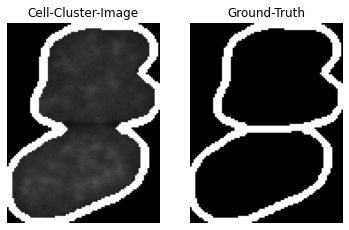

float32
(129, 110)


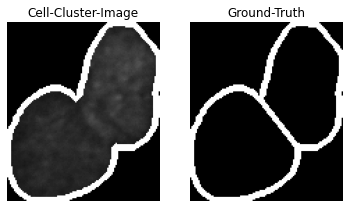

float32
(120, 104)


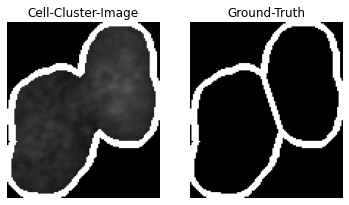

float32
(115, 161)


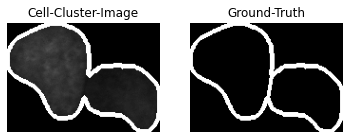

In [ ]:
# Load random images from the dataset and display them together with their ground-truths
for file in random.choices(os.listdir('/tmp/O_data/train/'), k=4):
  # load image as pixel array
  raw = image.imread('/tmp/O_data/train/' + str(file))
  mask = image.imread('/tmp/O_data/train/solutions/' + str(file))
  # summarize shape of the pixel array
  print(raw.dtype)
  print(raw.shape)
  # display the array of pixels as an image
  plt.subplot(1,2,1), plt.imshow(raw, 'gray')
  plt.title('Cell-Cluster-Image'), plt.axis('off')
  plt.subplot(1,2,2), plt.imshow(mask, 'gray')
  plt.title('Ground-Truth'), plt.axis('off')
  plt.show()

##Distribution of the pixel values

In [ ]:
def hist_list(picture_list):
  """Collect all the pixel and show them in a histogram

  Paramters:
  ----------
  picture_list:list
    A list with paths to the pictures which should be used
  
  Returns:
  --------
  hist_figure:NoneType
    Its a matplotlib.pyplot object which include the pictures plotted in this
    function. Use plt.show(figure) to show the plots.
  uniques_pixels:np.array
    Inculde all the values occure in the pictures
  """
  
  hist_figure = plt.figure()
  all_pixel = plt.imread(picture_list[0]).flatten()
  for i in picture_list[1:]:
    all_pixel = np.append(all_pixel, plt.imread(picture_list[0]).flatten())
  plt.hist(all_pixel)
  uniques_pixels = np.unique(all_pixel)
  plt.xlabel("Pixel values")
  plt.ylabel("Number of counts")
  return hist_figure, uniques_pixels

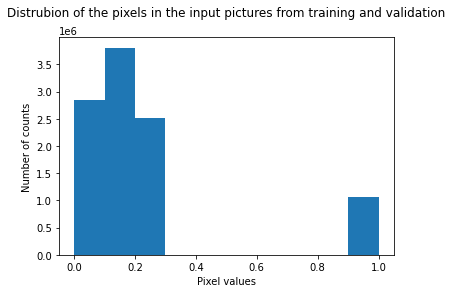

Unique values in the pictures: [0.         0.06666667 0.07843138 0.08235294 0.08627451 0.09019608
 0.09411765 0.09803922 0.10196079 0.10588235 0.10980392 0.11372549
 0.11764706 0.12156863 0.1254902  0.12941177 0.13333334 0.13725491
 0.14117648 0.14509805 0.14901961 0.15294118 0.15686275 0.16078432
 0.16470589 0.16862746 0.17254902 0.1764706  0.18039216 0.18431373
 0.1882353  0.19215687 0.19607843 0.2        0.20392157 0.20784314
 0.21176471 0.21568628 0.21960784 0.22352941 0.22745098 0.23137255
 0.23529412 0.23921569 0.24313726 0.24705882 0.2509804  0.25490198
 0.25882354 0.2627451  0.26666668 0.27058825 0.27450982 0.2784314
 0.28235295 0.28627452 0.2901961  0.29411766 0.3019608  0.30588236
 0.30980393 1.        ] 




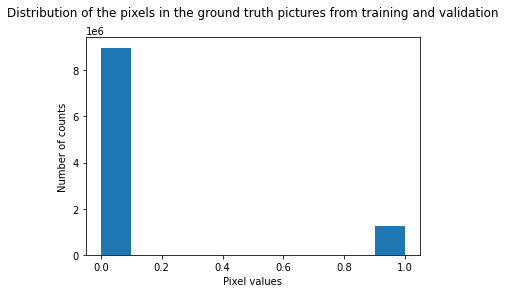

Unique values in the pictures: [0. 1.]


In [ ]:
#Make a histogramm for all pixel in training and validation set
hist1, uniques1 = hist_list(train_list + valid_list)
plt.title("Distrubion of the pixels in the input pictures from training and validation\n")
plt.show(hist1)
print("Unique values in the pictures:", uniques1, "\n\n")
hist2, uniques2 = hist_list(train_ground_list + valid_ground_list)
plt.title("Distribution of the pixels in the ground truth pictures from training and validation\n")
plt.show(hist2)
print("Unique values in the pictures:", uniques2)

##Size of each image

In [ ]:
#Get shapes of all pictures
shape_list = []
shape_list_row = []
shape_list_colum = []
for i in train_list:
  pic =plt.imread(i)
  shape_list.append(pic.shape)
  shape_list_row.append(pic.shape[0])
  shape_list_colum.append(pic.shape[1])
for i in valid_list:
  pic =plt.imread(i)
  shape_list.append(pic.shape)
  shape_list_row.append(pic.shape[0])
  shape_list_colum.append(pic.shape[1])

Maximum width in the pictures is: 379
Maximum height in the pictures is: 344


Text(0, 0.5, 'Number of pictures')

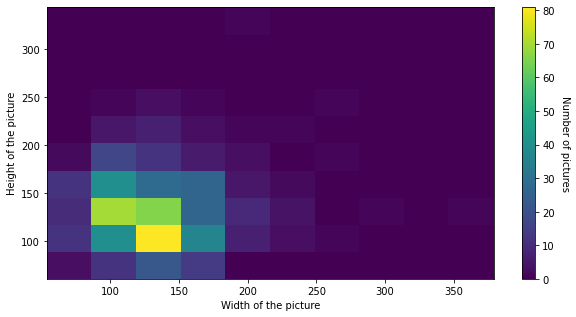

In [ ]:
shape_list_row = [value[0] for value in shape_list]
shape_list_colum = [value[1] for value in shape_list]
print("Maximum width in the pictures is:", max(shape_list_row))
print("Maximum height in the pictures is:", max(shape_list_colum))
hist2d_plot = plt.figure(figsize=(10,5))
plt.hist2d(shape_list_row, shape_list_colum, density=False)
plt.xlabel("Width of the picture")
plt.ylabel("Height of the picture")
#legend
cbar = plt.colorbar()
cbar.ax.get_yaxis().labelpad = 15
cbar.ax.set_ylabel('Number of pictures', rotation=270)

#Chapter 2 - Zero Padded Images 

At a first step of this project the input data was handled by using a 0 padding approach. The different sized images were loaded into a 256 x 256 matrix by filling up missing cells with the value 0, bigger pictures were cut into shape. Based on these matrices a multi-dimensional tensor was created to fit the required input shape for the used CNN models. 

The input size of 256 x 256 was used as a suitable image size for all of the following models


Please use the following code chunk as an illustration for the creation of the 0 padded tensor. One chunk ahead you can load the matrix from your tmp directory. 

In [ ]:
def get_data_into_matrix(input_list, ground_truth_list, row, column):
  """Get all pictures in one big matrix with defined weidth and hight of the 
  pictures. If the pictrues does not fit the defined weidth or hight then the 
  pictures will be cuted or zero padded on the affected axes.

  Arguments:
  ----------
  input_list:list
    A list with paths to the pictures which should be used.
  ground_truth_list:
    A list with paths to the ground truth of pictures which should be used.
  row:int
    The width of the pictures wich should be used.
  max_column:int
    The heigth of the pictures wich should be used.

  Returns:
  --------
  input_matrix:np.array
    Matrix with all of the pictues with shape [pictures, row, column, 1]
  train_matrix_ground_truth
    Matrix with all of the ground truth pictues with shape 
    [pictures, row, column, 1]
  """
  input_matrix = np.zeros((len(input_list), row, column, 1))
  ground_truth_matrix = np.zeros((len(ground_truth_list), row, column, 1))
  for counter, sample in enumerate(zip(input_list, ground_truth_list)):
    pic = plt.imread(sample[0])
    pic_ground_truth = plt.imread(sample[1])
    if pic.shape[0] <= row:
      pic = np.pad(pic, ((0, row-pic.shape[0]),(0,0)))
      pic_ground_truth = np.pad(pic_ground_truth, ((0, row-pic_ground_truth.shape[0]),(0,0)))
    else:
      pic = pic[:row,:]
      pic_ground_truth = pic_ground_truth[:row,:]
    if pic.shape[1] <= column:
      pic = np.pad(pic, ((0,0),(0, column-pic.shape[1])))
      pic_ground_truth = np.pad(pic_ground_truth, ((0,0),(0, column-pic_ground_truth.shape[1])))
    else:
      pic = pic[:,:column]
      pic_ground_truth = pic_ground_truth[:,column]
    input_matrix [counter,:,:,0] = pic
    ground_truth_matrix[counter,:,:,0] = pic_ground_truth
  return input_matrix, ground_truth_matrix



## use an image size of 256*256 (still quite big for most of the pictures)
train_matrix, train_matrix_ground_truth = get_data_into_matrix(train_list, train_ground_list, 256, 256)
valid_matrix, valid_matrix_ground_truth = get_data_into_matrix(valid_list, valid_ground_list, 256, 256)


## save 256*256-sized images
np.save("/tmp/train_matrix_256", train_matrix)
np.save("/tmp/train_matrix_ground_truth_256", train_matrix_ground_truth)
np.save("/tmp/valid_matrix_256", valid_matrix)
np.save("/tmp/valid_matrix_ground_truth_256", valid_matrix_ground_truth)
 

With the following code chunck you can load the tensor directly from your tmp directory  

(555, 256, 256, 1) (42, 256, 256, 1)


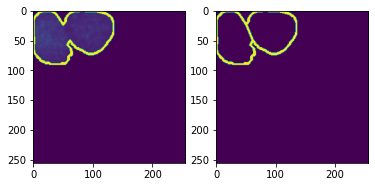

In [ ]:
# Load the input data
train_matrix = np.load("/tmp/O_data/train_matrix_256.npy")
train_matrix_ground_truth = np.load("/tmp/O_data/train_matrix_ground_truth_256.npy")
valid_matrix = np.load("/tmp/O_data/valid_matrix_256.npy")
valid_matrix_ground_truth = np.load("/tmp/O_data/valid_matrix_ground_truth_256.npy")

max_row = 256
max_colum = 256

print(train_matrix.shape, valid_matrix.shape)
picNumber = np.random.randint(4)
plt.subplot(1,2,1)
plt.imshow(train_matrix[picNumber,:,:,0])
plt.subplot(1,2,2)
plt.imshow(train_matrix_ground_truth[picNumber,:,:,0])

##First initial model

Instead of executing the training of the following model, please load the model including the pretrained weight in the next code chunk. 


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 256, 256, 1)       5         
Total params: 5
Trainable params: 5
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
1/1 [==============================] - 10s 10s/step - loss: 0.6955 - accuracy: 0.9635 - val_loss: 0.6952 - val_accuracy: 0.9539

Epoch 00001: val_loss improved from inf to 0.69516, saving model to /content/drive/MyDrive/kaggle/Model/simpel_model_binary_crossentropy.h5
Epoch 2/500
1/1 [==============================] - 5s 5s/step - loss: 0.6950 - accuracy: 0.9635 - val_loss: 0.6947 - val_accuracy: 0.9539

Epoch 00002: val_loss improved from 0.69516 to 0.69470, saving model to /content/drive/MyDrive/kaggle/Model/simpel_model_binary_cros

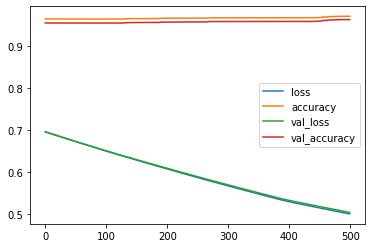

In [ ]:
strategy = tf.distribute.MirroredStrategy()

tf.random.set_seed(0)
with strategy.scope():
  baseline_model = tf.keras.Sequential([
                      tf.keras.layers.InputLayer((max_row, max_colum,1)),
                      tf.keras.layers.Convolution2D(1,2,1,"same", activation="sigmoid"),
  ])
  baseline_model.compile(optimizer = "adam",
              loss = "binary_crossentropy",
              metrics = ['accuracy']
              #loss = tfa.losses.SigmoidFocalCrossEntropy(),
              #metrics = [tfa.metrics.F1Score(num_classes=1, average='micro', threshold=0.5)]
              )
  
baseline_model.summary()

callbacks = [
             tf.keras.callbacks.ModelCheckpoint('/tmp/simpel_model_binary_crossentropy.h5', verbose=1, save_best_only=True),
             tf.keras.callbacks.EarlyStopping(patience=5, monitor='val_loss'),
             ]

baseline_model.fit(train_matrix, train_matrix_ground_truth, validation_data = (valid_matrix, valid_matrix_ground_truth), epochs = 500, verbose =1, batch_size = 555, callbacks = callbacks)
performance = pd.DataFrame(baseline_model.history.history)
performance.plot()

###Predictions


In [ ]:
baseline_model = keras.models.load_model('/tmp/Model/simpel_model_binary_crossentropy.h5')
print("Validation of the initial model:")
results = baseline_model.evaluate(valid_matrix, valid_matrix_ground_truth, batch_size=1)
print("test loss, test accuracy:", results)

Validation of the initial model:
42/42 [==============================] - 30s 2ms/step - loss: 0.5040 - accuracy: 0.9620
test loss, test accuracy: [0.5040009617805481, 0.9619867205619812]


In [ ]:
#Inc. of a helper function to visualize the prediction
def plot_some_data(plot_number, number_of_columns, input_matrix, ground_truth_matrix, prediction_matrix):
    """Its the same as the previous function ("plot_some_data") just extanded with the predictions
    from the model and without paths instead the big matrixs

    Parameters:
    -----------
    plot_number:int
      Number of plots you want to make.
    number_of_columns:int
      Number of columns in the figure.
    input_matrix:np.array
      Numpy array with the input data
    ground_truth_matrix:np.array
      Numpy array with the input data
    prediction_matrix:np.array
      Numpy array with the prediction of a model
  
    Returns:
    --------
    Nothing
    """
    space = 0
    figure = plt.figure(figsize=(30,30))
    for i in range(plot_number):
      #picture
      plt.subplot(np.ceil(plot_number/number_of_columns)*3, number_of_columns, i+1+space)
      plt.imshow(input_matrix[i, :, :, 0], aspect="auto")
      plt.title(f"Input picture number {i}")
      #ground truth
      plt.subplot(np.ceil(plot_number/number_of_columns)*3, number_of_columns, i+number_of_columns+1+space)
      plt.imshow(ground_truth_matrix[i, :, :, 0], aspect="auto")
      plt.title(f"Groud truth number {i}")
      #prediction
      plt.subplot(np.ceil(plot_number/number_of_columns)*3, number_of_columns, i+number_of_columns*2+1+space)
      plt.imshow(prediction_matrix[i, :, :, 0], aspect="auto")
      plt.title(f"model prediction number {i}")
      if ((i+1)%number_of_columns)==0:
        space += number_of_columns*2
    # plt.imshow(figure)

def predict_values(input_matrix, ground_truth, model):
  """This function let the model predict and plots the input, ground truth and
  prediction in a subplot.

  Parameters:
  -----------
  input_matrix:np.array
    Numpy array with the input data
  ground_truth_matrix:np.array
    Numpy array with the input data
  model:Tensorflow model
    A tensorflow model
  
  Returns:
  --------
  Nothing
  """

  prediction = model.predict(input_matrix)
  plot_some_data(input_matrix.shape[0], 5, input_matrix, ground_truth, prediction)

number_of_pic = 10
random_number = np.random.randint(train_matrix.shape[0]-number_of_pic)

**Traing Data**

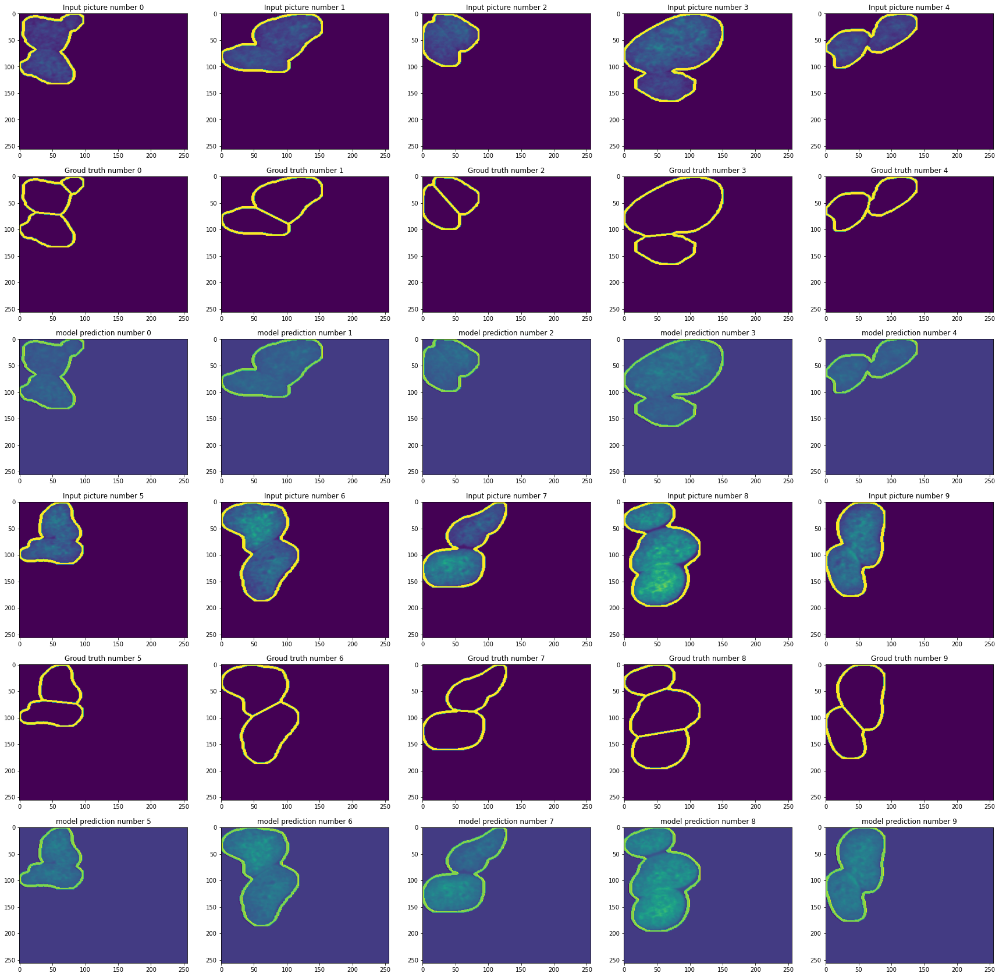

In [ ]:
number_of_pic = 10
random_number = np.random.randint(train_matrix.shape[0]-number_of_pic)
predict_values(train_matrix[random_number:random_number+number_of_pic], train_matrix_ground_truth[random_number:random_number+number_of_pic], baseline_model)

**Vailidation Data**

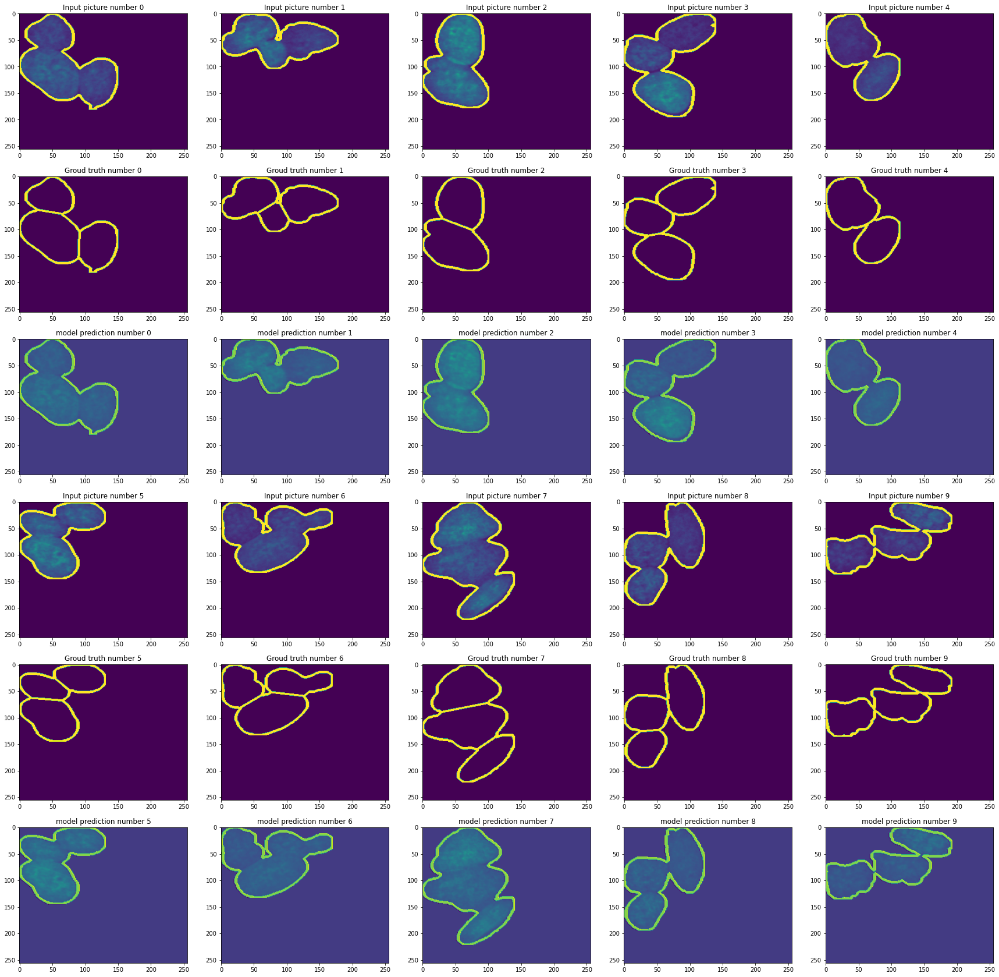

In [ ]:
random_number = np.random.randint(valid_matrix.shape[0]-number_of_pic)
predict_values(valid_matrix[random_number:random_number+number_of_pic], valid_matrix_ground_truth[random_number:random_number+number_of_pic], baseline_model)

##U-Net
For biomedical image segmentation this special CNN was developed. It dosen't requiere a lot of data to perfom well. The arichtecture of the model has two parts:
* The contracting path, which will extracted the features from the picture 
* The expansive path wich combine the features and spatial information

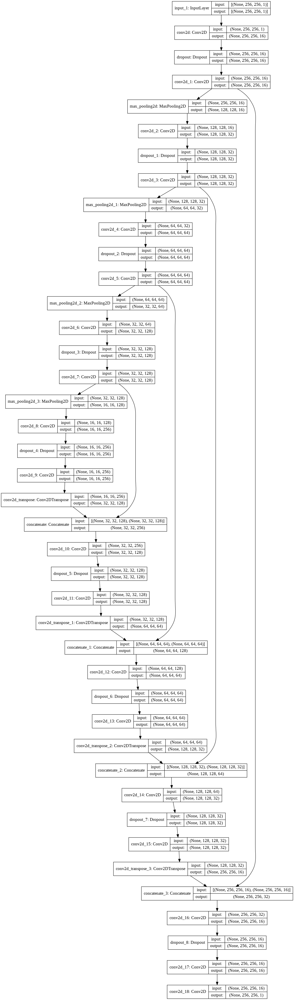

In [ ]:
inputs = tf.keras.layers.Input((256, 256,1))

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)
 
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)
 
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)
 
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path 
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
 
u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
 
u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
 
u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
 
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

tf.random.set_seed(0)
u_net_model = tf.keras.Model(inputs=[inputs], outputs=[outputs])

tf.keras.utils.plot_model(u_net_model, show_shapes = True)

In [ ]:
u_net_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 160         input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 256, 256, 16) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 16) 2320        dropout[0][0]                    
______________________________________________________________________________________________

Epoch 1/50
35/35 [==============================] - 14s 234ms/step - loss: 0.2250 - accuracy: 0.9532 - val_loss: 0.0594 - val_accuracy: 0.9819

Epoch 00001: val_loss improved from inf to 0.05939, saving model to /content/drive/MyDrive/kaggle/Model/U-Net_model_BinaryCrossentropy.h5
Epoch 2/50
35/35 [==============================] - 5s 135ms/step - loss: 0.0272 - accuracy: 0.9934 - val_loss: 0.0480 - val_accuracy: 0.9834

Epoch 00002: val_loss improved from 0.05939 to 0.04797, saving model to /content/drive/MyDrive/kaggle/Model/U-Net_model_BinaryCrossentropy.h5
Epoch 3/50
35/35 [==============================] - 5s 135ms/step - loss: 0.0183 - accuracy: 0.9962 - val_loss: 0.0333 - val_accuracy: 0.9915

Epoch 00003: val_loss improved from 0.04797 to 0.03330, saving model to /content/drive/MyDrive/kaggle/Model/U-Net_model_BinaryCrossentropy.h5
Epoch 4/50
35/35 [==============================] - 5s 136ms/step - loss: 0.0142 - accuracy: 0.9969 - val_loss: 0.0214 - val_accuracy: 0.9956

Epoch

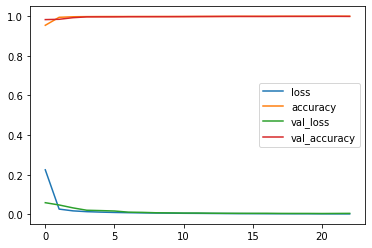

In [ ]:
u_net_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

callbacks = [
        tf.keras.callbacks.ModelCheckpoint('/tmp/U-Net_model_BinaryCrossentropy.h5', verbose=1, save_best_only=True),
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        #tf.keras.callbacks.TensorBoard(log_dir='logs')
        ]

# Fit the model
results = u_net_model.fit(train_matrix, train_matrix_ground_truth, validation_data = (valid_matrix, valid_matrix_ground_truth), batch_size=16, epochs=50, callbacks=callbacks)

# check out the metrics...
performance = pd.DataFrame(u_net_model.history.history)
performance.plot()

###Predictions

In [ ]:
u_net_model = keras.models.load_model('/tmp/Model/U-Net_model_BinaryCrossentropy.h5')
#u_net_model = keras.models.load_model('/content/drive/MyDrive/kaggle/Model/U-Net_model_BinaryCrossentropy.h5')
print("Validation of the U-Net:")
results = u_net_model.evaluate(valid_matrix, valid_matrix_ground_truth, batch_size=1)
print("test loss, test accuracy:", results)

Validation of the U-Net:
42/42 [==============================] - 3s 4ms/step - loss: 0.0050 - accuracy: 0.9981
test loss, test accuracy: [0.004963876213878393, 0.9980675578117371]


**Training data**

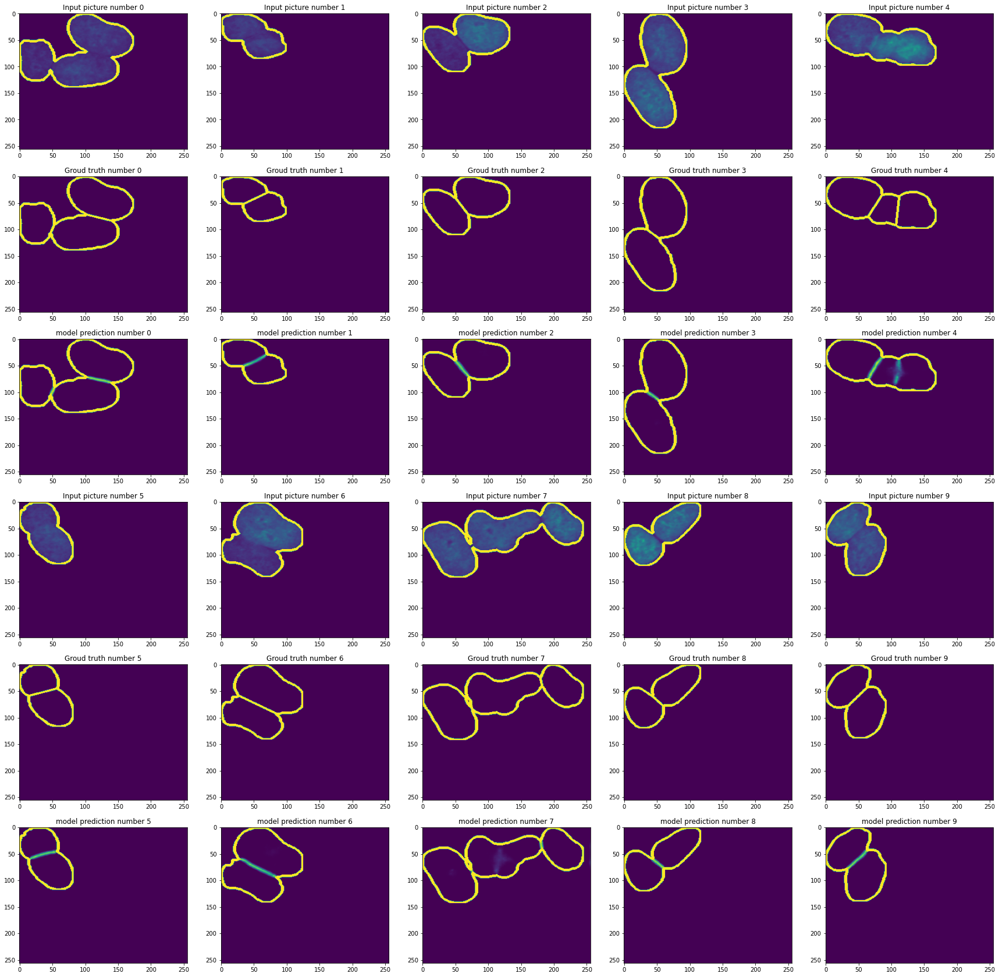

In [ ]:
number_of_pic = 10
random_number = np.random.randint(train_matrix.shape[0]-number_of_pic)
predict_values(train_matrix[random_number:random_number+number_of_pic], train_matrix_ground_truth[random_number:random_number+number_of_pic], u_net_model)

**Vailidation Data**

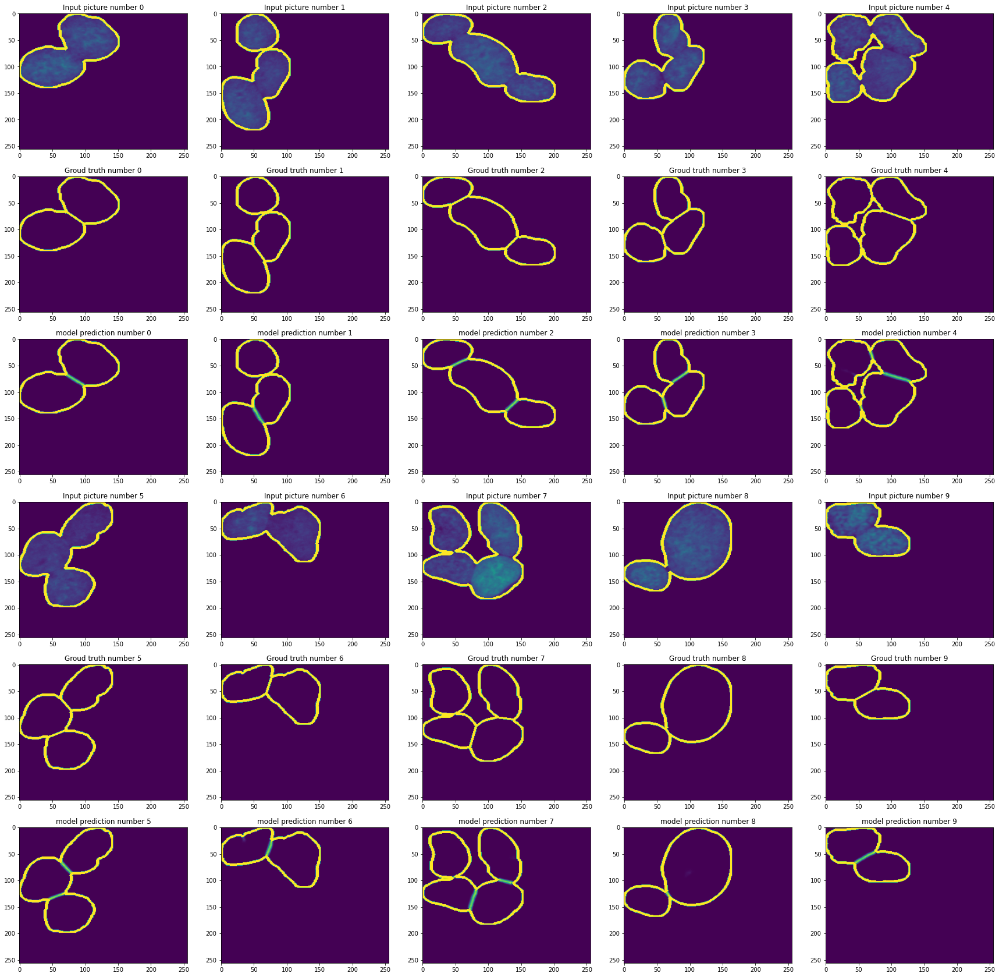

In [ ]:
number_of_pic = 10
random_number = np.random.randint(valid_matrix.shape[0]-number_of_pic)
predict_values(valid_matrix[random_number:random_number+number_of_pic], valid_matrix_ground_truth[random_number:random_number+number_of_pic], u_net_model)

### Adjustment of the Metric and the Loss

By looking at the pixel-distribution in the ground-truth pictures it becomes obvious that we are facing a problem of quite high class imbalance. This is a common challenge in the field of image segmentation...
Due to the presence of lots more background-pixels compared to pixels which seperate two nuclei it is very easy for the model to achieve a high accuracy. Let´s assume our model would always classify each pixel as background - we would still get an accuracy of > 90% which clearly doesn´t reflect the quality of our model!

To account for this problem we need to find metrics that can better reflect the goodness of the models predictions and try out different loss-functions that account for the problem of class-imbalance.

In [ ]:
from tensorflow.keras import backend as K
# Define the metrics
def dice_coefficient(y_true, y_pred, axis=(0,1), epsilon = 0.00001):
    #y_pred = tf.cast((y_pred > 0.5), tf.float32)
    dice_numerator   = 2*(K.sum(y_true*y_pred, axis=axis))+epsilon
    dice_denominator = K.sum(y_pred, axis=axis) + K.sum(y_true, axis=axis) + epsilon
    dice_coefficient = K.mean(dice_numerator / dice_denominator)
    
    return dice_coefficient

def soft_dice_loss(y_true, y_pred, axis=(0,1), epsilon = 0.00001):
    #y_pred = tf.cast((y_pred > 0.5), tf.float32)
    dice_numerator   = 2*(K.sum(y_true*y_pred, axis=axis))+epsilon
    dice_denominator = K.sum(y_pred*y_pred, axis=axis) + K.sum(y_true*y_true, axis=axis) + epsilon
    dice_coefficient = 1 - K.mean(dice_numerator / dice_denominator)

    return dice_coefficient

def jacard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)

    #y_pred_f = tf.cast((y_pred_f > 0.5), tf.float32)

    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)


def jacard_coef_loss(y_true, y_pred):
    return -jacard_coef(y_true, y_pred)  # -1 ultiplied as we want to minimize this value as loss function


ALPHA = 0.8
GAMMA = 2

def FocalLoss(targets, inputs, alpha=ALPHA, gamma=GAMMA):    
    
    inputs = K.flatten(inputs)
    targets = K.flatten(targets)
    
    BCE = K.binary_crossentropy(targets, inputs)
    BCE_EXP = K.exp(-BCE)
    focal_loss = K.mean(alpha * K.pow((1-BCE_EXP), gamma) * BCE)
    
    return focal_loss

We want to try out different loss-functions and see how well they perform on the given data when training a U-net model. Therefore we define different loss-functions and train a seperate model for each of them. We will check them out after training all of them. Additionally we will look at different metrics to evaluate the models.

ATTENTION: The following code appears to have some problems. It was observed that models get overwritten somehow. Because we are not sure about the consistency of the achieved results, we won´t rely that much on them and choose the metric and the loss for further model training based on rational reasons. The approach and the problem is shown anyway.

(Status 22.06.21)
As soon as a solution is found, we will update the notebook.

In [ ]:
# Training on different loss-functions:

# Define the model-parameters
# Save different loss-functions you want to train a U-Net model on in a dictionary. Give them a key under which the models will be saved and identified later.
loss_functions = {"BC":'binary_crossentropy', "SFCE":tfa.losses.SigmoidFocalCrossEntropy(), "FL":FocalLoss, "Dice":soft_dice_loss, "Jaccard":jacard_coef_loss}
optimizer = keras.optimizers.Adam(learning_rate=0.001) # default = 0.001 for Adam
metrics = [tfa.metrics.F1Score(num_classes=1, average='micro', threshold=0.5), jacard_coef, dice_coefficient, 'accuracy']

# Create a dictionary where the models will be saved (use the key you used for the loss-functions to identify your model).
my_models = {}
# create a results table, where the different model-evaluation-parameters will be saved
results = []
# Similiar to the models dictionary, also save the models performances in a seperate dictionary in order to look at them later.
performances = {}

# Iterate over each key in the loss-functions-dictionary
for loss_key in loss_functions:
    tf.random.set_seed(0)
    # Define Callbacks
    callbacks = [
        tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/kaggle/Model/U-Net_model_'+loss_key+'-loss.h5', verbose=1, save_best_only=True),
        tf.keras.callbacks.EarlyStopping(patience=5, monitor='val_loss'),
        ]
    # Define and train the model
    my_models[loss_key] = tf.keras.Model(inputs=[inputs], outputs=[outputs])
    my_models[loss_key].compile(optimizer = optimizer, loss = loss_functions[loss_key], metrics = metrics)
    my_models[loss_key].fit(train_matrix, train_matrix_ground_truth, validation_data = (valid_matrix, valid_matrix_ground_truth), batch_size=16, epochs=20, callbacks=callbacks)

    # Save the performances-plots
    performances[loss_key] = pd.DataFrame(my_models[loss_key].history.history)

    # Evaluate the model on the test data using `evaluate`
    print("Evaluate on validation data")
    valid_evaluation = my_models[loss_key].evaluate(valid_matrix, valid_matrix_ground_truth, batch_size=50)
    print("loss and metrics:", valid_evaluation)
    results.append(valid_evaluation)

# create a dataframe summarizing all the results from the different models.
results = pd.DataFrame(results, index=loss_functions.keys(), columns=["Loss-value","F1-value", "Jaccard-value", "Dice-value", "Accuracy"])

Epoch 1/20
35/35 [==============================] - ETA: 0s - loss: 0.3133 - f1_score: 0.2488 - jacard_coef: 0.1541 - dice_coefficient: 0.1932 - accuracy: 0.9410

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


35/35 [==============================] - 12s 223ms/step - loss: 0.3133 - f1_score: 0.2488 - jacard_coef: 0.1541 - dice_coefficient: 0.1932 - accuracy: 0.9410 - val_loss: 0.0583 - val_f1_score: 0.7893 - val_jacard_coef: 0.4307 - val_dice_coefficient: 0.5141 - val_accuracy: 0.9792

Epoch 00001: val_loss improved from inf to 0.05831, saving model to /content/drive/MyDrive/kaggle/Model/U-Net_model_BC-loss.h5
Epoch 2/20
35/35 [==============================] - 5s 144ms/step - loss: 0.0229 - f1_score: 0.9133 - jacard_coef: 0.7095 - dice_coefficient: 0.7500 - accuracy: 0.9944 - val_loss: 0.0228 - val_f1_score: 0.9339 - val_jacard_coef: 0.7453 - val_dice_coefficient: 0.8142 - val_accuracy: 0.9945

Epoch 00002: val_loss improved from 0.05831 to 0.02285, saving model to /content/drive/MyDrive/kaggle/Model/U-Net_model_BC-loss.h5
Epoch 3/20
35/35 [==============================] - 5s 144ms/step - loss: 0.0150 - f1_score: 0.9457 - jacard_coef: 0.8058 - dice_coefficient: 0.8185 - accuracy: 0.9965 - 

In [ ]:
results.head() # final results for validation-data
# The models appear to get trained wel on any of the defined loss-functions.
# Although Binary crossentropy seems to be a bit better at this point we will focus on the SigmoidalFocalCrossEntropy, which seems easiest to handle, since
# it is predefined by keras and optimized for an image segmentation task with data like ours, with heavy class-imbalance...
# Our upcoming adjustments on the model-training and input data will reveal, whether we will be able to fulfill the task with the help of this loss.

,Loss-value,F1-value,Jaccard-value,Dice-value,Accuracy
BC,0.004977,0.978070,0.941170,0.924222,0.998150
SFCE,0.000500,0.976976,0.865415,0.800564,0.998089
FL,0.003541,0.955509,0.854322,0.797379,0.996291
Dice,0.017143,0.977108,0.920654,0.876519,0.998089
Jaccard,-0.945018,0.978494,0.945018,0.875119,0.998202


Model history with adjusted mask and BC-loss-function:
Model history with adjusted mask and SFCE-loss-function:
Model history with adjusted mask and FL-loss-function:
Model history with adjusted mask and Dice-loss-function:
Model history with adjusted mask and Jaccard-loss-function:


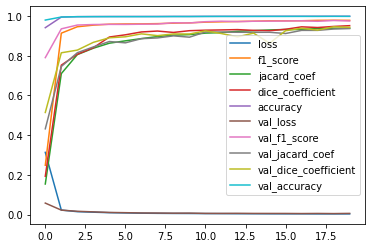

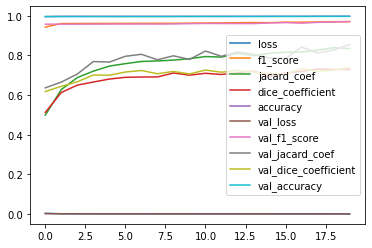

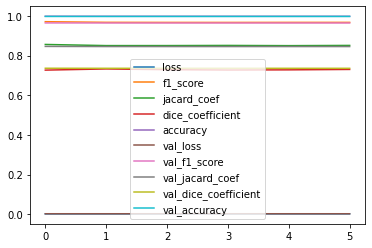

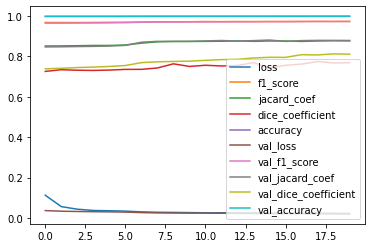

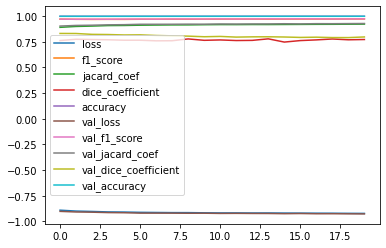

In [ ]:
# show the performance of each model in the training-process
for loss_key in loss_functions:
  print("Model history with adjusted mask and " + str(loss_key) + "-loss-function:")
  performances[loss_key].plot()

In [ ]:
print("\n\nEvaluate on validation data")
valid_evaluation = my_models["BC"].evaluate(valid_matrix, valid_matrix_ground_truth, batch_size=50)
print("loss and metrics:", valid_evaluation)

print("\n\nEvaluate on validation data")
valid_evaluation = my_models["SFCE"].evaluate(valid_matrix, valid_matrix_ground_truth, batch_size=50)
print("loss and metrics:", valid_evaluation)

print("\n\nEvaluate on validation data")
valid_evaluation = my_models["Jaccard"].evaluate(valid_matrix, valid_matrix_ground_truth, batch_size=50)
print("loss and metrics:", valid_evaluation)



Evaluate on validation data


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


1/1 [==============================] - 0s 262ms/step - loss: 0.0073 - f1_score: 0.9757 - jacard_coef: 0.9342 - dice_coefficient: 0.9149 - accuracy: 0.9980
loss and metrics: [0.007277452386915684, 0.9756675958633423, 0.9341784715652466, 0.9149332046508789, 0.9979854822158813]


Evaluate on validation data
1/1 [==============================] - 0s 274ms/step - loss: 0.0012 - f1_score: 0.9757 - jacard_coef: 0.9342 - dice_coefficient: 0.9149 - accuracy: 0.9980
loss and metrics: [0.0012265460100024939, 0.9756675958633423, 0.9341784715652466, 0.9149332046508789, 0.9979854822158813]


Evaluate on validation data
1/1 [==============================] - 0s 115ms/step - loss: -0.9342 - f1_score: 0.9757 - jacard_coef: 0.9342 - dice_coefficient: 0.9149 - accuracy: 0.9980
loss and metrics: [-0.9341784715652466, 0.9756675958633423, 0.9341784715652466, 0.9149332046508789, 0.9979854822158813]


Status (22.06.21)

There seems to be a problem with the models saved in the "my_models"-dictionary. It appears that every model in the dictionary has the same weights: By looking at the previous chunk you can see that although the loss-values differ, the metrics are exactly the same for each model. Also the predictions made for the models look exactly the same.
There must be a problem with the model-saving in the dictionary, that causes the models to get overwritten. As you can see in the results-table, the model-metrics should be different.

Unfortunately I´m not very experienced in programming, therefore I couldn´t identify and fix the problem yet... as soon as a solution is found we will update the notebook.

In [ ]:
number_of_pic = 5
random_number = np.random.randint(valid_matrix.shape[0]-number_of_pic)

for loss_key in loss_functions: 
    model = ('/content/drive/MyDrive/kaggle/Model/U-Net_model_'+loss_key+'-loss.h5')
    predict_values(valid_matrix[random_number:random_number+number_of_pic], valid_matrix_ground_truth[random_number:random_number+number_of_pic], my_models[loss_key])

Output hidden; open in https://colab.research.google.com to view.

(Status: 22.06.2021)

Adding the following code chunk causes a problem which occurs while loading a model from gdrive (generated in the 'my-models'-dictionary containing the different loss-functions). There seems to be an issue with loading models with self defined metrics, when trying to load a model with 'keras.model.load_model'. In order to avoid that problem, in the following we will only use the F1-Loss from Tensorflow. Since this metric is well suited for image segmentation-task with unbalanced classes it should be suffiecient for our model evaluation.

As soon as a solution will be found, we will update the notebook. 


In [ ]:

my_model = keras.models.load_model('/content/drive/MyDrive/kaggle/Model/U-Net_model_'+ 'BC' + '-loss.h5')
# ValueError: Unknown metric function: jacard_coef.

##ResNet50 - transfer learning
Residual neural network uses skip connection (or short cut) to avoid the problem of the vanishing gradient. A skip connection jumps over some layers and add there features to the last skipped layer.

For transfer learning we decided to use a pretrained model called ResNet50.


###Loading ResNet50

94773248/94765736 [==============================] - 1s 0us/step


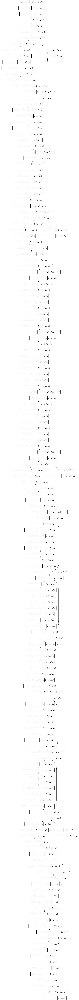

In [ ]:
# Loading and looking into the achrictecture of the ResNet
from tensorflow.keras.applications.resnet50 import ResNet50
!pip install tensorflow_addons
import tensorflow_addons as tfa
ResNet50_model = ResNet50(include_top = False, input_shape = (256,256,3))
tf.keras.utils.plot_model(ResNet50_model, show_shapes = True)

###Upsampling the features

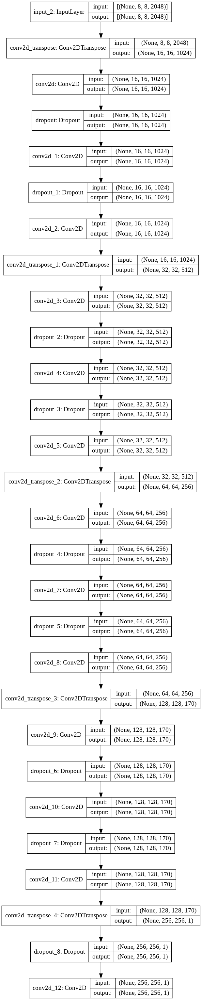

In [ ]:
"""The last layer has the output [None, 8, 8, 2048] so we will upsample it to 
the size if [None, 256, 256, 1]"""
def upsampling_model():
  #Expanding path
  input = tf.keras.layers.Input((8,8,2048))
  upsampling1 = tf.keras.layers.Conv2DTranspose(1024, 2,strides = 2)(input)
  upsampling1 = tf.keras.layers.Conv2D(1024, 1,strides = 1, padding="Same", activation = "relu")(upsampling1)
  upsampling1 = tf.keras.layers.Dropout(0.1)(upsampling1)
  upsampling1 = tf.keras.layers.Conv2D(1024, 1,strides = 1, padding="Same", activation = "relu")(upsampling1)
  upsampling1 = tf.keras.layers.Dropout(0.1)(upsampling1)
  upsampling1 = tf.keras.layers.Conv2D(1024, 1,strides = 1, padding="Same", activation = "relu")(upsampling1)
  for i in range(3):
    upsampling1 = tf.keras.layers.Conv2DTranspose(512/(i+1), 2,strides = 2)(upsampling1)
    upsampling1 = tf.keras.layers.Conv2D(512/(i+1), 1,strides = 1, padding="Same", activation = "relu")(upsampling1)
    for ii in range(2):
      upsampling1 = tf.keras.layers.Dropout(0.1)(upsampling1)
      upsampling1 = tf.keras.layers.Conv2D(512/(i+1), 1,strides = 1, padding="Same", activation = "relu")(upsampling1)
  upsampling1 = tf.keras.layers.Conv2DTranspose(1, 2,strides = 2)(upsampling1)
  upsampling1 = tf.keras.layers.Dropout(0.1)(upsampling1)
  upsampling1 = tf.keras.layers.Conv2D(1, 1,strides = 1, padding="Same", activation = "sigmoid")(upsampling1)
  upsample_model = tf.keras.Model(inputs = input, outputs = upsampling1)
  return upsample_model

up_model = upsampling_model()
tf.keras.utils.plot_model(up_model, show_shapes = True)
# del up_model

###Put them together

In [ ]:
strategy = tf.distribute.MirroredStrategy()
with strategy.scope():
  ResNet50_model = ResNet50(include_top = False, input_shape = (256,256,3))
  upsample_model = upsampling_model()
  Pretrained_model = tf.keras.Sequential([ResNet50_model, upsample_model])
  Pretrained_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tfa.losses.SigmoidFocalCrossEntropy(), metrics=[tfa.metrics.F1Score(num_classes=1, average='micro', threshold=0.5)])

ResNet50_model.trainable = False
Pretrained_model.summary()

name = "Pretrained_model"
callbacks = [
        tf.keras.callbacks.ModelCheckpoint('/tmp/'+ name + '.h5', verbose=0, save_best_only=True),     
        tf.keras.callbacks.EarlyStopping(patience=25, monitor='loss'),
        ]
# Fit the model
results = Pretrained_model.fit(np.repeat(train_matrix,3,-1), train_matrix_ground_truth, validation_data = (np.repeat(valid_matrix,3,-1), valid_matrix_ground_truth),
                       batch_size=30, epochs=1000, callbacks=callbacks, verbose = 1)
# check out the metrics
performance = pd.DataFrame(Pretrained_model.history.history)
performance.plot()

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


19/19 [==============================] - 77s 1s/step - loss: 0.0352 - f1_score: 0.0192 - val_loss: 0.1643 - val_f1_score: 0.0000e+00


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/1000
19/19 [==============================] - 17s 908ms/step - loss: 0.0200 - f1_score: 0.0000e+00 - val_loss: 0.0530 - val_f1_score: 0.0000e+00
Epoch 3/1000
19/19 [==============================] - 18s 936ms/step - loss: 0.0190 - f1_score: 0.0000e+00 - val_loss: 0.1609 - val_f1_score: 0.0000e+00
Epoch 4/1000
19/19 [==============================] - 18s 953ms/step - loss: 0.0180 - f1_score: 0.0000e+00 - val_loss: 0.1583 - val_f1_score: 0.0000e+00
Epoch 5/1000
19/19 [==============================] - 18s 923ms/step - loss: 0.0169 - f1_score: 0.0000e+00 - val_loss: 0.1604 - val_f1_score: 0.0000e+00
Epoch 6/1000
19/19 [==============================] - 17s 911ms/step - loss: 0.0159 - f1_score: 0.0000e+00 - val_loss: 0.1617 - val_f1_score: 0.0000e+00
Epoch 7/1000
19/19 [==============================] - 17s 919ms/step - loss: 0.0150 - f1_score: 0.0000e+00 - val_loss: 0.1607 - val_f1_score: 0.0000e+00
Epoch 8/1000
19/19 [==============================] - 18s 924ms/step - loss: 0.014

###Predictions

**Note**

Due to the high file size in case of the RestNet50, we were not able to offer you the option of just loading the model as in the case of the U-Net. Please execute the training of the ResNet50 by yourself. 


In [ ]:
#Pretrained_model = tf.keras.models.load_model('tmp/O_data/Model/Pretrained_model.h5')
#print("Validation of the Pretrained model:")
#results = Pretrained_model.evaluate(np.repeat(valid_matrix,3,-1), valid_matrix_ground_truth, batch_size=1, verbose = 0)
#print(f"validation loss:{results[0]:.3f}, validation F1-Score:{results[1]:.2f}")

Validation of the Pretrained model:


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


validation loss:0.003, validation F1-Score:0.88


**Traing Data**

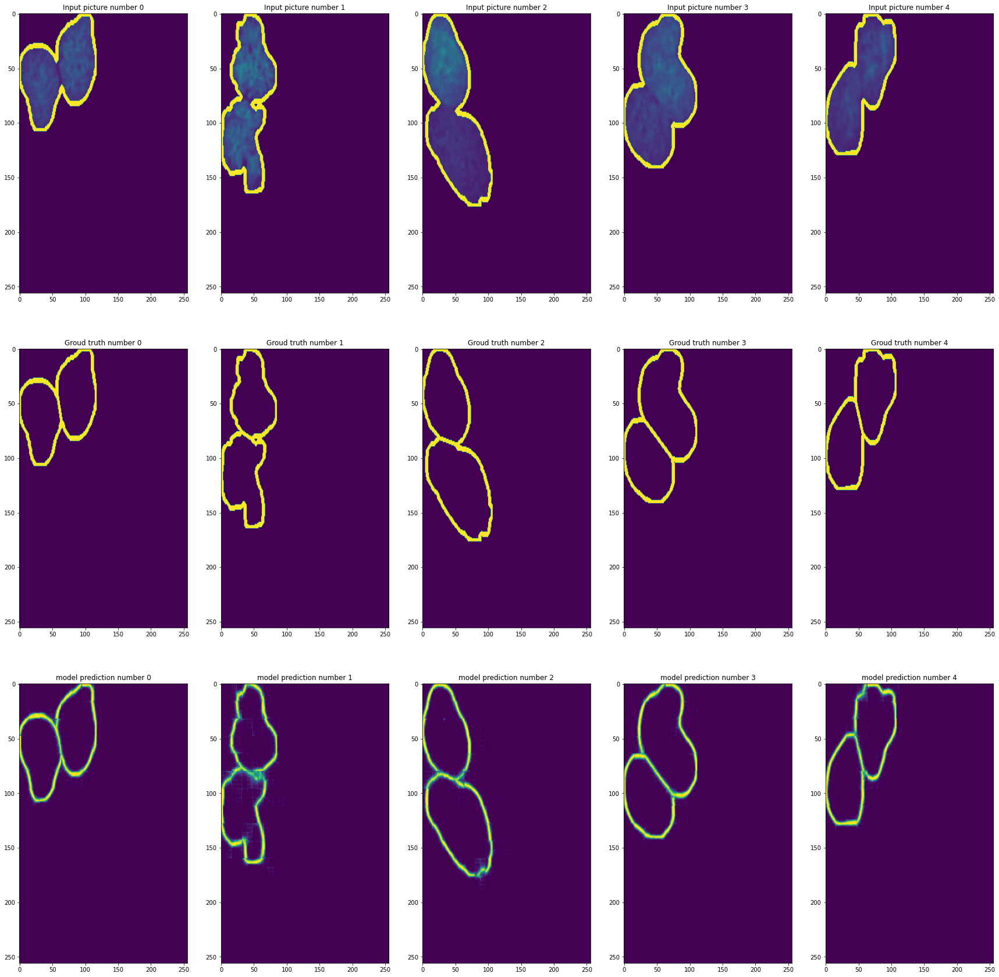

In [ ]:
number_of_pic = 5
random_number = np.random.randint(train_matrix.shape[0]-number_of_pic)
predict_values(np.repeat(train_matrix[random_number:random_number+number_of_pic],3,-1), train_matrix_ground_truth[random_number:random_number+number_of_pic], Pretrained_model)

**Vailidation Data**

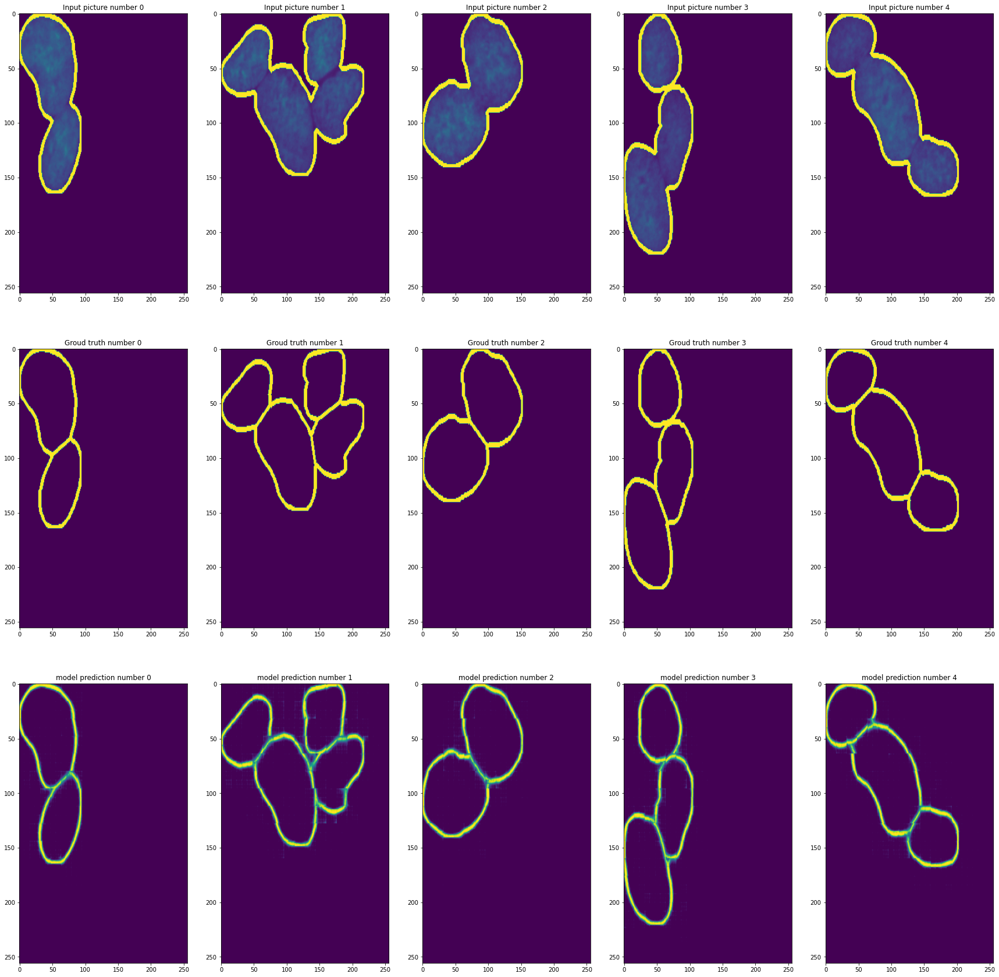

In [ ]:
number_of_pic = 5
random_number = np.random.randint(valid_matrix.shape[0]-number_of_pic)
predict_values(np.repeat(valid_matrix[random_number:random_number+number_of_pic],3,-1), valid_matrix_ground_truth[random_number:random_number+number_of_pic], Pretrained_model)

###Fine tuning

In [ ]:
strategy = tf.distribute.MirroredStrategy()
with strategy.scope():
  if 1:
    Fine_tuned_model = tf.keras.models.load_model('/tmp/Pretrained_model.h5')
    #Fine_tuned_model = tf.keras.models.load_model('/content/drive/MyDrive/kaggle/Model/Pretrained_model.h5')
  Fine_tuned_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss=tfa.losses.SigmoidFocalCrossEntropy(), metrics=[tfa.metrics.F1Score(num_classes=1, average='micro', threshold=0.5)])
ResNet50_model.trainable = True
Fine_tuned_model.summary()
name = "Fine_tuned_model"
callbacks = [
        tf.keras.callbacks.ModelCheckpoint('/tmp/'+ name + '.h5', verbose=1, save_best_only=True),
        #tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/kaggle/Model/'+ name + '.h5', verbose=1, save_best_only=True),
        tf.keras.callbacks.EarlyStopping(patience=25, monitor='val_loss'),
        #tf.keras.callbacks.TensorBoard(log_dir='logs')
        ]

# Fit the model
results = ResNet50_model.trainable = True.fit(np.repeat(train_matrix,3,-1), train_matrix_ground_truth, validation_data = (np.repeat(valid_matrix,3,-1), valid_matrix_ground_truth),
                       batch_size=30, epochs=1000, callbacks=callbacks)
# check out the metrics...
performance = pd.DataFrame(ResNet50_model.trainable = True.history.history)
performance.plot()

###Prediction

**Note**

Due to the high file size in case of the RestNet50, we were not able to offer you the option of just loading the model as in the case of the U-Net. Please execute the training of the ResNet50 by yourself. 

In [ ]:
#Fine_tuned_model = tf.keras.models.load_model('/tmp/O_data/Model/Fine_tuned_model.h5')
#print("Validation of the fine tuned model:")
#results = Fine_tuned_model.evaluate(np.repeat(valid_matrix,3,-1), valid_matrix_ground_truth, batch_size=1, verbose = 0)
#print(f"validation loss:{results[0]:.3f}, validation F1-Score:{results[1]:.2f}")

Validation of the fine tuned model:


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


validation loss:0.003, validation F1-Score:0.90


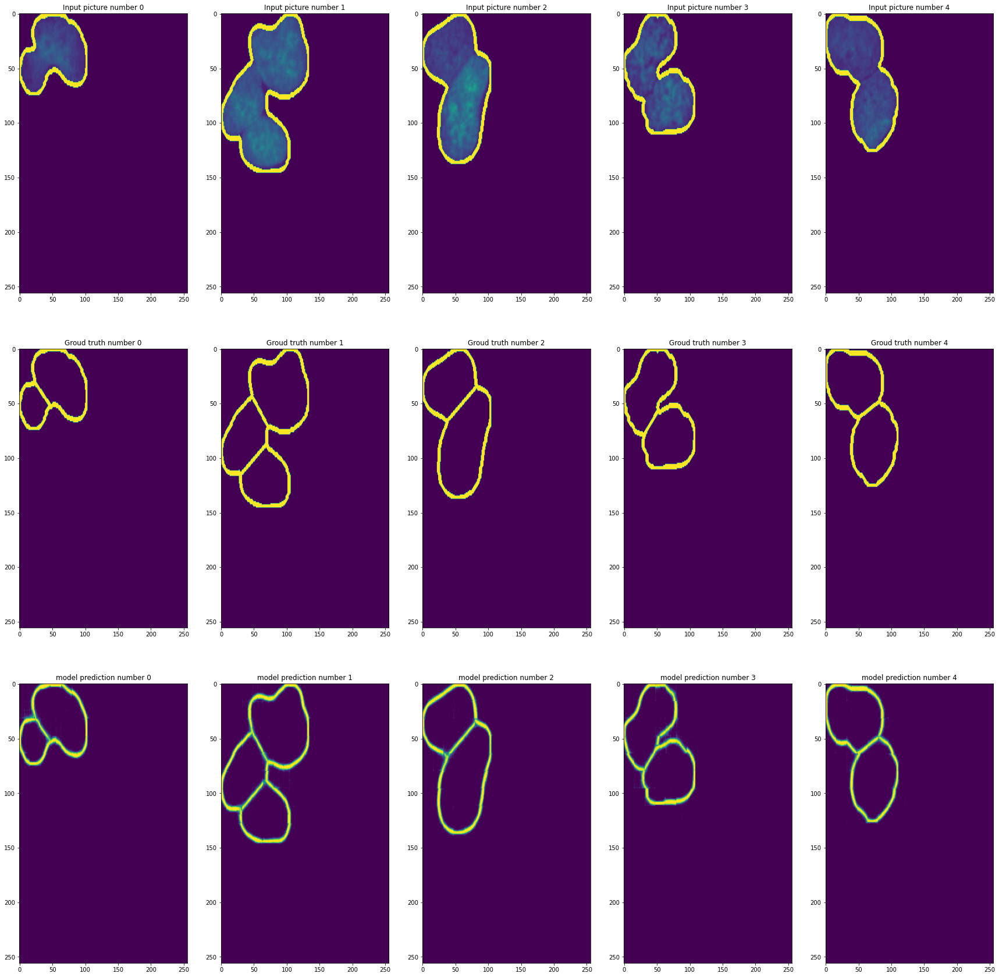

In [ ]:
number_of_pic = 5
random_number = np.random.randint(train_matrix.shape[0]-number_of_pic)
predict_values(np.repeat(train_matrix[random_number:random_number+number_of_pic],3,-1), train_matrix_ground_truth[random_number:random_number+number_of_pic], Fine_tuned_model)

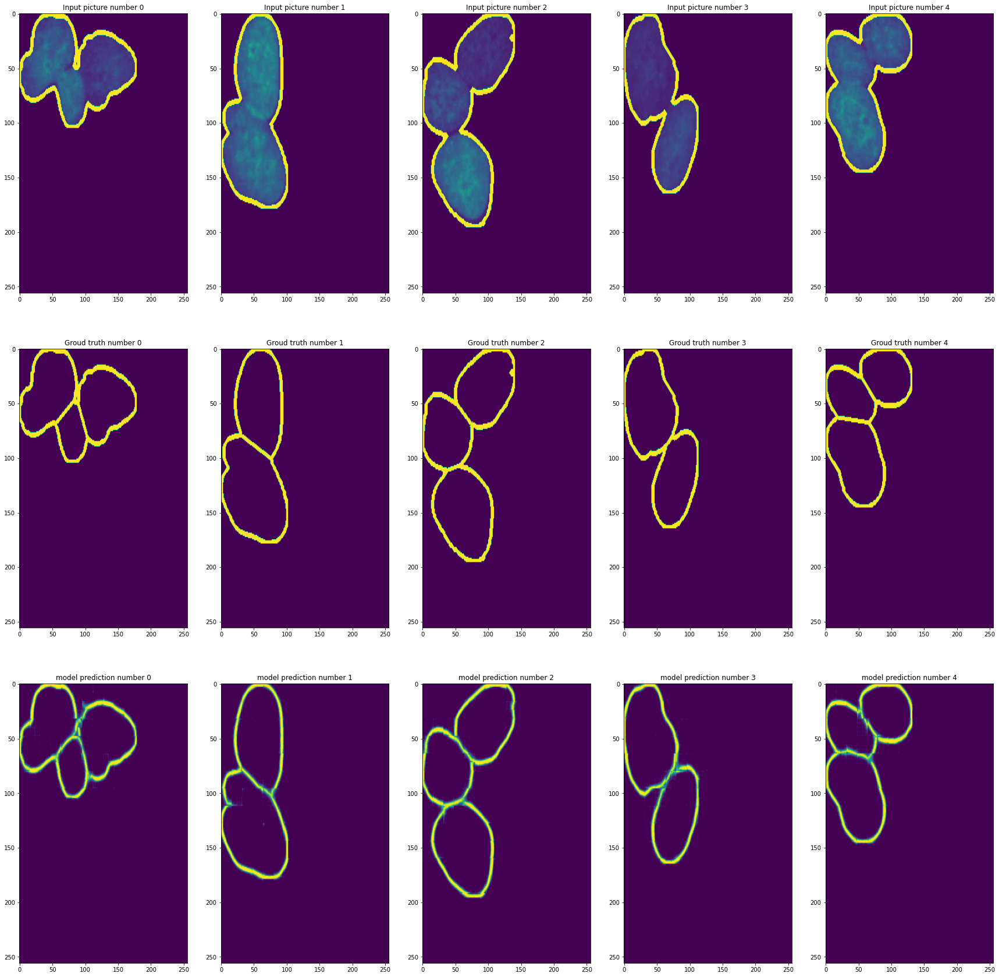

In [ ]:
number_of_pic = 5
random_number = np.random.randint(valid_matrix.shape[0]-number_of_pic)
predict_values(np.repeat(valid_matrix[random_number:random_number+number_of_pic],3,-1), valid_matrix_ground_truth[random_number:random_number+number_of_pic], Fine_tuned_model)

# Chapter 3 - Handling of the Input Data


##Adjustment of the Ground Truth

The mask images used so far in this project are characterized by the fact that no distinction is made between the outer boundaries of the cell and the edges that overlap.  

This observation becomes clear by the fact that both classes are encoded with the value of 1 within the mask image. Since the raw data also encoded the outer boundaries of the cell as 1, we want to get rid of these outer boundaries within our ground truth. With such an adjustment the used metric will better represent the actual quality of the model, without accounting for information we already had from the beginning.

This process of adjusting the mask images is illustrated in the next code chunk. Again, the fully optimized dataset is also provided by a zip file which you already uploaded in chapter 1..


To use the following code chunk, you need to define your desired path to safe the images. Alternatively, we again provide the mentioned data in form of a zip file. Please use the on code chunk ahead in order to use them. 

In [ ]:
from skimage import io
# load skimage because matplotlib won´t save a grayscale-image and change the shape of the images...
def adjust_mask(input_path, input_GT_path, output_path, output, extension = ".png"):
  """
  A new folder will be created with adjusted mask images...
  The outer boundaries of the nuclei will be deleted in the mask-pictures since 
  they do not give any new information for the training process.

  Arguments:
  ----------
  input_path:path
    A path to the input-images
  input_GT_path:
    A path to the Ground-Truth-images
  output_path:
    path to directory where output-folder shall be generated
  output:
    name of output-folder
  extension:
    extension of images

  Returns: None
  """
  os.mkdir(output_path+output)
  output_path = output_path+"/"+output+"/"
  os.mkdir(output_path+"solutions")
  #os.mkdir(output_path+"train")
  os.mkdir(output_path+"outlines")

  for file in os.listdir(input_path):
    if file.endswith(extension):
      pic = io.imread(input_path + file)
      pic_GT = io.imread(input_GT_path + file)

      pic_GT[pic==255] = 0
      outer_lines = io.imread(input_path + file)
      outer_lines[pic < 255] = 0

      io.imsave(output_path + "solutions/" + file, pic_GT.astype(np.uint16))
      #image.imsave(output_path + "train/" + file, pic)
      io.imsave(output_path + file, pic.astype(np.uint16))
      io.imsave(output_path + "outlines/" + file, outer_lines.astype(np.uint16))

#Please add your desired path
if os.path.isdir( None ):
  print("File exist")
else:
  my_output_path = None
  os.mkdir(my_output_path)
  adjust_mask("/tmp/O_data/train/", "/tmp/O_data/train/solutions/", my_output_path, "train")
  adjust_mask("/tmp/O_data/test/", "/tmp/O_data/test/solutions/", my_output_path, "test")


Number of pictures in the directory:
Pictures |  Ground_truth
------------------------
     555 |  555 Train
      42 |   42 Valid
     155 |      Test


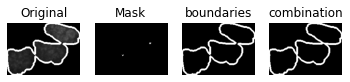

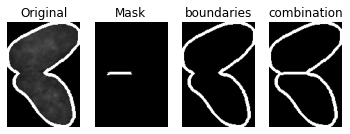

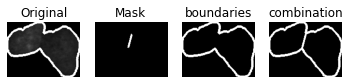

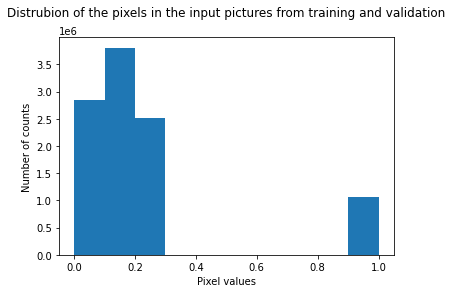

Unique values in the pictures: [0.         0.06666667 0.07843138 0.08235294 0.08627451 0.09019608
 0.09411765 0.09803922 0.10196079 0.10588235 0.10980392 0.11372549
 0.11764706 0.12156863 0.1254902  0.12941177 0.13333334 0.13725491
 0.14117648 0.14509805 0.14901961 0.15294118 0.15686275 0.16078432
 0.16470589 0.16862746 0.17254902 0.1764706  0.18039216 0.18431373
 0.1882353  0.19215687 0.19607843 0.2        0.20392157 0.20784314
 0.21176471 0.21568628 0.21960784 0.22352941 0.22745098 0.23137255
 0.23529412 0.23921569 0.24313726 0.24705882 0.2509804  0.25490198
 0.25882354 0.2627451  0.26666668 0.27058825 0.27450982 0.2784314
 0.28235295 0.28627452 0.2901961  0.29411766 0.3019608  0.30588236
 0.30980393 1.        ] 




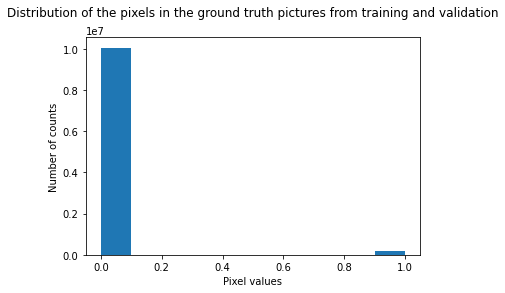

Unique values in the pictures: [0. 1.]
(555, 256, 256, 1) (42, 256, 256, 1)


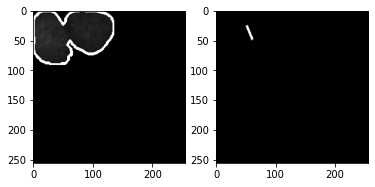

In [ ]:
# Training
train_list = get_Files("/tmp/O_data_mask_adjust/train", ".png")
train_ground_list = get_Files("/tmp/O_data_mask_adjust/train/solutions", ".png")
# Valid
valid_list = get_Files("/tmp/O_data_mask_adjust/test", ".png")
valid_ground_list = get_Files("/tmp/O_data_mask_adjust/test/solutions", ".png")
# Test, it has no ground truth
test_list = get_Files("/tmp/O_data_mask_adjust/valid", ".png")

# Print the number of available files
print("\nNumber of pictures in the directory:")
print("Pictures |  Ground_truth")
print("------------------------")
print(f"    {len(train_list):4} | {len(train_ground_list):4} Train")
print(f"    {len(valid_list):4} |   {len(valid_ground_list)} Valid")
print(f"    {len(test_list):4} |      Test")

# Load random images from the adjusted masks
my_path = "/tmp/O_data_mask_adjust" + "/test/"
for file in random.choices(os.listdir(my_path), k=3):
  # load image as pixel array
  pic_GT = image.imread(my_path+"solutions/" + str(file))
  pic = image.imread(my_path + str(file))
  pic_OL = image.imread(my_path+"outlines/" + str(file))
  combined = pic_OL + pic_GT
  # display the array of pixels as an image
  plt.subplot(1,4,1), plt.imshow(pic, 'gray')
  plt.title('Original'), plt.axis('off')
  plt.subplot(1,4,2), plt.imshow(pic_GT, 'gray')
  plt.title('Mask'), plt.axis('off')
  plt.subplot(1,4,3), plt.imshow(pic_OL, 'gray')
  plt.title('boundaries'), plt.axis('off')
  plt.subplot(1,4,4), plt.imshow(combined, 'gray')
  plt.title('combination'), plt.axis('off')
  plt.show()

#Make a histogramm for all pixel in training and validation set
hist1, uniques1 = hist_list(train_list + valid_list)
plt.title("Distrubion of the pixels in the input pictures from training and validation\n")
plt.show(hist1)
print("Unique values in the pictures:", uniques1, "\n\n")
hist2, uniques2 = hist_list(train_ground_list + valid_ground_list)
plt.title("Distribution of the pixels in the ground truth pictures from training and validation\n")
plt.show(hist2)
print("Unique values in the pictures:", uniques2)

# Put the data into Arrays with defined shape of 256, 256 for the model-training
train_matrix, train_matrix_ground_truth = get_data_into_matrix(train_list, train_ground_list, 256, 256)
valid_matrix, valid_matrix_ground_truth = get_data_into_matrix(valid_list, valid_ground_list, 256, 256)

print(train_matrix.shape, valid_matrix.shape)
picNumber = np.random.randint(4)
plt.subplot(1,2,1)
plt.imshow(train_matrix[picNumber,:,:,0], "gray")
plt.subplot(1,2,2)
plt.imshow(train_matrix_ground_truth[picNumber,:,:,0], "gray")

###U-Net



Epoch 1/100
35/35 [==============================] - ETA: 0s - loss: 0.0190 - f1_score: 0.0792

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


35/35 [==============================] - 7s 153ms/step - loss: 0.0190 - f1_score: 0.0792 - val_loss: 0.0014 - val_f1_score: 2.1422e-04

Epoch 00001: val_loss improved from inf to 0.00139, saving model to /tmp/U-Net_model_SigmoidFocalCrossEntropy_maskAdjusted.h5
Epoch 2/100
35/35 [==============================] - 5s 146ms/step - loss: 7.1124e-04 - f1_score: 1.1308e-04 - val_loss: 8.4595e-04 - val_f1_score: 0.0000e+00

Epoch 00002: val_loss improved from 0.00139 to 0.00085, saving model to /tmp/U-Net_model_SigmoidFocalCrossEntropy_maskAdjusted.h5
Epoch 3/100
35/35 [==============================] - 5s 146ms/step - loss: 4.9586e-04 - f1_score: 4.5293e-05 - val_loss: 7.4421e-04 - val_f1_score: 0.0000e+00

Epoch 00003: val_loss improved from 0.00085 to 0.00074, saving model to /tmp/U-Net_model_SigmoidFocalCrossEntropy_maskAdjusted.h5
Epoch 4/100
35/35 [==============================] - 5s 146ms/step - loss: 4.3706e-04 - f1_score: 9.0584e-05 - val_loss: 6.9278e-04 - val_f1_score: 0.0000e+00

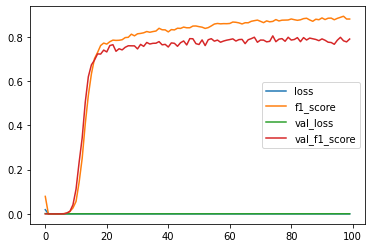

In [ ]:
tf.random.set_seed(0)
u_net_model_maskAdjusted = tf.keras.Model(inputs=[inputs], outputs=[outputs])
#u_net_model_maskAdjusted.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
u_net_model_maskAdjusted.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tfa.losses.SigmoidFocalCrossEntropy(), metrics=[tfa.metrics.F1Score(num_classes=1, average='micro', threshold=0.5)])

callbacks = [
        tf.keras.callbacks.ModelCheckpoint('/tmp/U-Net_model_SigmoidFocalCrossEntropy_maskAdjusted.h5', verbose=1, save_best_only=True),
        tf.keras.callbacks.EarlyStopping(patience=10, monitor='loss'),
        ]

# Fit the model
u_net_model_maskAdjusted.fit(train_matrix, train_matrix_ground_truth, validation_data = (valid_matrix, valid_matrix_ground_truth), batch_size=16, epochs=100, callbacks=callbacks)

# check out the metrics...
performance = pd.DataFrame(u_net_model_maskAdjusted.history.history)
performance.plot()

###Prediction

In [ ]:
u_net_model_maskAdjusted = keras.models.load_model('/tmp/Model/U-Net_model_SigmoidFocalCrossEntropy_maskAdjusted.h5')
#u_net_model_maskAdjusted = keras.models.load_model('/tmp/Model/U-Net_model_BC_maskAdjusted.h5')

print("Validation of the U-Net Adjusted GT:")
results = u_net_model_maskAdjusted.evaluate(valid_matrix, valid_matrix_ground_truth, batch_size=1)
print("test loss, test f1:", results)

Validation of the U-Net Adjusted GT:
42/42 [==============================] - 0s 5ms/step - loss: 0.0063 - accuracy: 0.9977
test loss, test f1: [0.0063074552454054356, 0.9977409839630127]


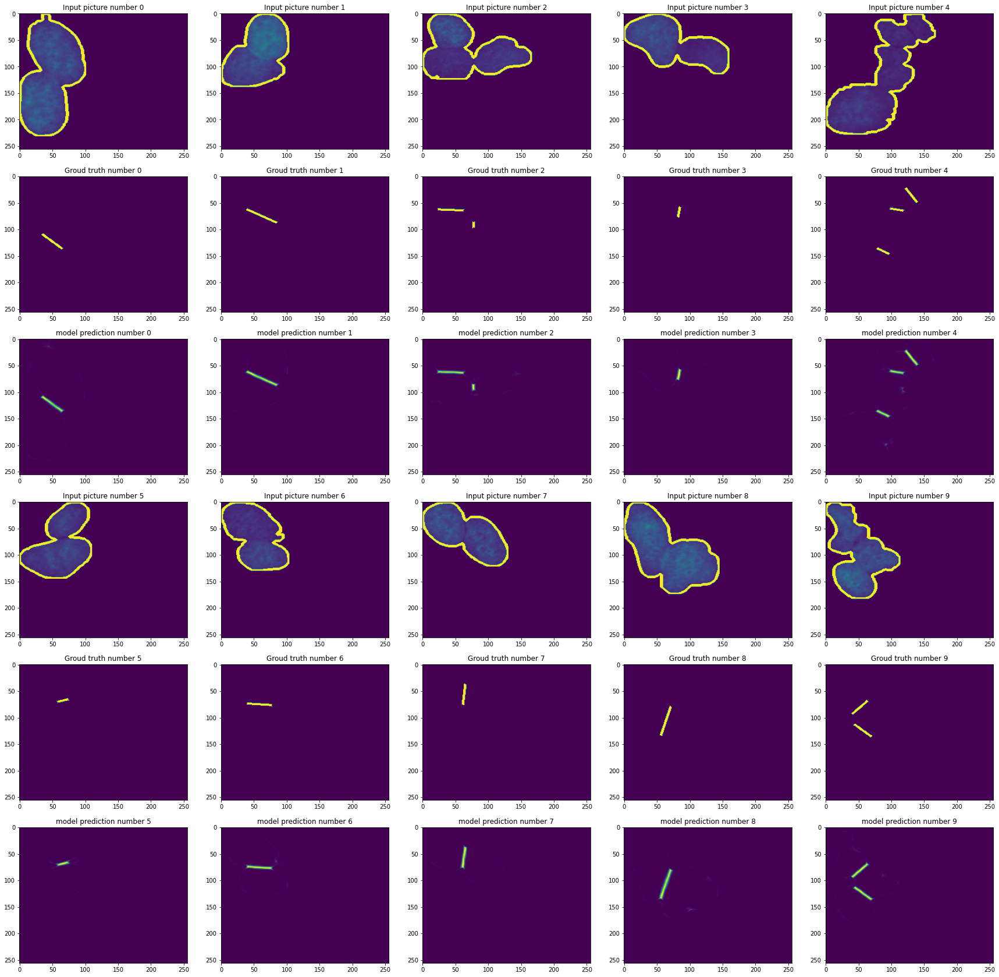

In [ ]:
number_of_pic = 10
random_number = np.random.randint(train_matrix.shape[0]-number_of_pic)
predict_values(train_matrix[random_number:random_number+number_of_pic], train_matrix_ground_truth[random_number:random_number+number_of_pic], u_net_model_maskAdjusted)

**Validation Data**

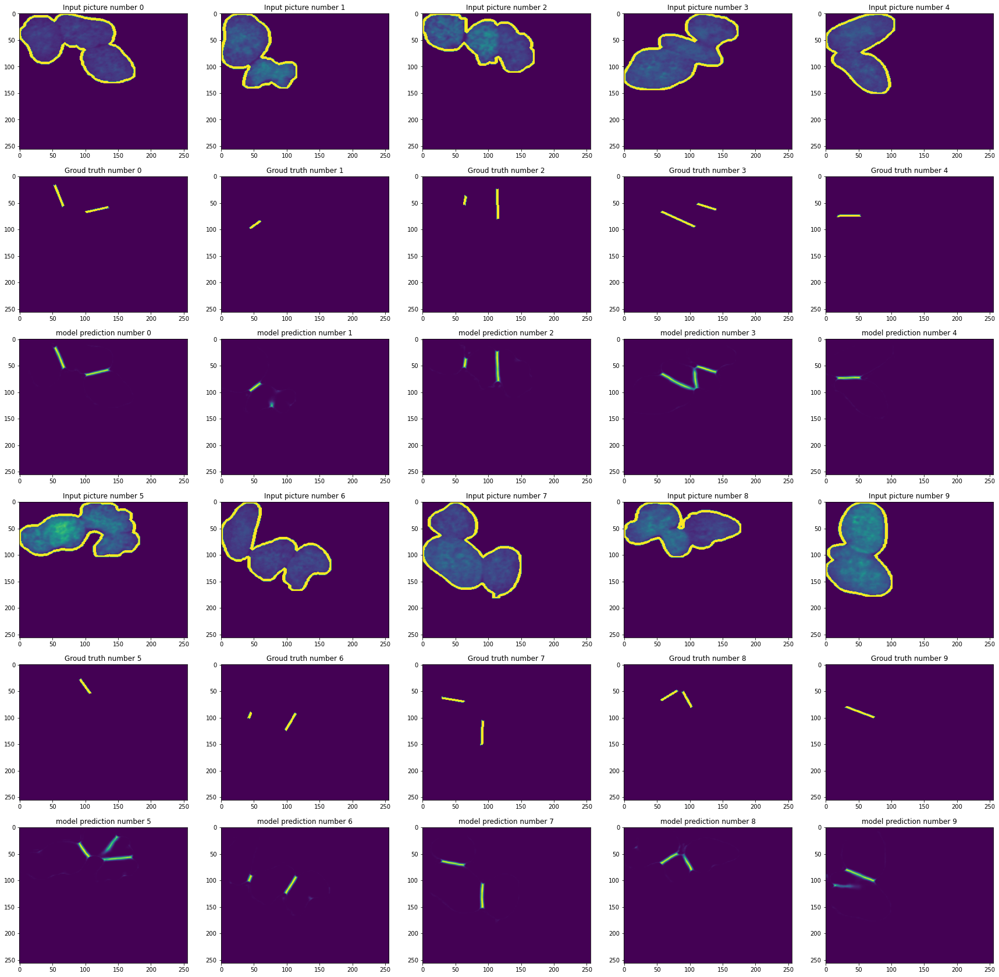

In [ ]:
random_number = np.random.randint(valid_matrix.shape[0]-number_of_pic)
predict_values(valid_matrix[random_number:random_number+number_of_pic], valid_matrix_ground_truth[random_number:random_number+number_of_pic], u_net_model_maskAdjusted)

##Image Generator

So far static input data was used while executing the training of each model. In this chapter the Image Generator out of the TensorFlow framework will be used to provided real time augmentation of the images for each epoch of training.

Due to the circumstances of this project, it is necessary to consider the following requirement which occur in the context image segmentation:

- simultaneous augmentation of raw and mask image
- no changes in the distribution of pixel values regarding the mask images 


Considering the findings of the previous chapter, we will continue to use the adjusted ground truth for further models.  




In [ ]:
#Image_Generator for training
batch_size = 32
image_size = 256

data_gen_args = dict(rescale= 1/255,
                     horizontal_flip=True,
                     vertical_flip=True,
                     #rotation_range=90,
                     #width_shift_range=0.1,
                     #height_shift_range=0.1,
                     #zoom_range=0.2,
                     fill_mode = 'constant')
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

seed = 1
image_generator = image_datagen.flow_from_directory(
    '/tmp/IG_data/train_raw',
    batch_size = batch_size,
    class_mode=None,
    target_size = (image_size, image_size),
    color_mode="grayscale",
    seed=seed)
mask_generator = mask_datagen.flow_from_directory(
    '/tmp/IG_data/train_solutions',
    batch_size = batch_size,
    class_mode=None,
    target_size = (image_size, image_size),
    color_mode="grayscale",
    seed=seed)

train_generator = zip(image_generator, mask_generator)
print(type(train_generator))

Found 555 images belonging to 1 classes.
Found 555 images belonging to 1 classes.
<class 'zip'>


(32, 256, 256, 1)


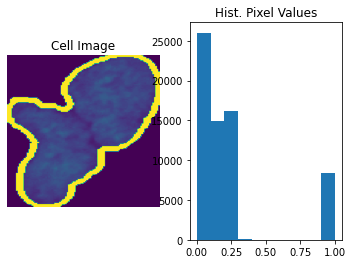

(32, 256, 256, 1)


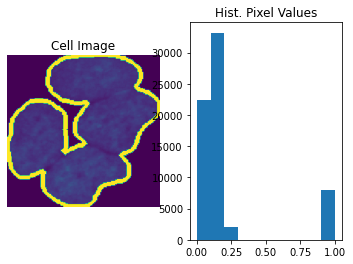

In [ ]:
for i in range(2):
    img = image_generator.next()    
    im = np.squeeze(img[0])
    tt = im.flatten()

    #(BachtSize, Image Size, Channels)
    print(img.shape)
    plt.subplot(1,2,1), 
    plt.imshow(im)
    #plt.imshow(im,cmap='gray')
    plt.title('Cell Image'), plt.axis('off')
    plt.subplot(1,2,2)
    plt.hist(tt)
    plt.title('Hist. Pixel Values')
    plt.show()

(32, 256, 256, 1)
[0. 1.]


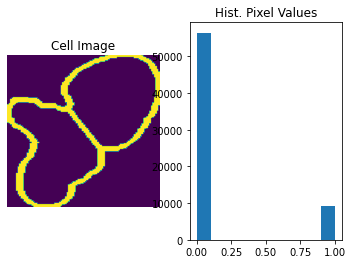

(32, 256, 256, 1)
[0. 1.]


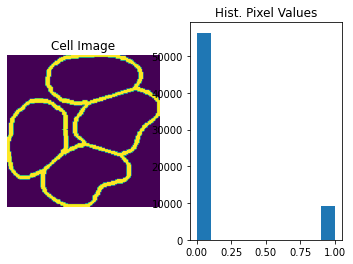

In [ ]:
for i in range(2):
    img = mask_generator.next()    
    im = np.squeeze(img[0])
    tt = im.flatten()

    #(BachtSize, Image Size, Channels)
    print(img.shape)
    print(np.unique(tt))
    plt.subplot(1,2,1), 
    plt.imshow(im)
    #plt.imshow(im,cmap='gray')
    plt.title('Cell Image'), plt.axis('off')
    plt.subplot(1,2,2)
    plt.hist(tt)
    plt.title('Hist. Pixel Values')
    plt.show()

As in common practice we will not use image augmentation on the validation data. However, we will still use the Image Generator from TensorFlow to load these validation image in the same fashion as we did with the training data. This approach enables us to handel the fitting image size equaly. 

Due to the fact that the method model.fit() or model.fit_generator() do not excepts the zip datatype for the validation_data argument, we will extract a tensor out of our Image Generator. 

In [ ]:
# Image_Generator for validation
batch_size_val = 1
image_size = 256

image_datagen_val = ImageDataGenerator(rescale= 1/255)
mask_datagen_val = ImageDataGenerator(rescale= 1/255)

seed_val = 2
image_generator_val = image_datagen_val.flow_from_directory(
    '/tmp/IG_data/test_raw',
    batch_size = batch_size_val,
    class_mode=None,
    target_size = (image_size, image_size),
    color_mode="grayscale",
    seed=seed_val)
mask_generator_val = mask_datagen_val.flow_from_directory(
    '/tmp/IG_data/test_solutions',
    batch_size = batch_size_val,
    class_mode=None,
    target_size = (image_size, image_size),
    color_mode="grayscale",
    seed=seed_val)

val_generator = zip(image_generator_val, mask_generator_val)
print(type(val_generator))

Found 42 images belonging to 1 classes.
Found 42 images belonging to 1 classes.
<class 'zip'>


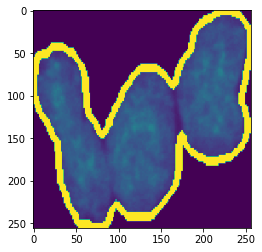

In [ ]:
validation_matrix_IG = np.zeros((len(valid_list), image_size, image_size, 1))
for i in range(42):
    img = image_generator_val.next()
    img = np.squeeze(img[0])
  
    validation_matrix_IG[i,:,:,0] = img
    
plt.imshow(validation_matrix_IG[4,:,:,0])

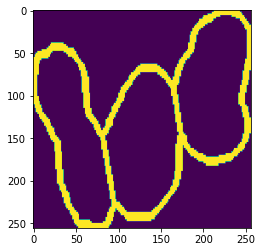

In [ ]:
validation_matrix_GT_IG = np.zeros((len(valid_list), image_size, image_size, 1))
for i in range(42):
    img = mask_generator_val.next()
    img = np.squeeze(img[0])
   
    validation_matrix_GT_IG[i,:,:,0] = img
    
plt.imshow(validation_matrix_GT_IG[4,:,:,0])


###U-Net

Epoch 1/50
17/17 [==============================] - ETA: 0s - loss: 0.1918 - f1_score: 0.8047

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


17/17 [==============================] - 12s 304ms/step - loss: 0.1918 - f1_score: 0.8047 - val_loss: 0.0562 - val_f1_score: 0.9465

Epoch 00001: val_loss improved from inf to 0.05622, saving model to /content/drive/MyDrive/kaggle/Model/U-Net_model_SigmoidFocalCrossEntropy_IG.h5
Epoch 2/50
17/17 [==============================] - 5s 286ms/step - loss: 0.0383 - f1_score: 0.9566 - val_loss: 0.0334 - val_f1_score: 0.9581

Epoch 00002: val_loss improved from 0.05622 to 0.03340, saving model to /content/drive/MyDrive/kaggle/Model/U-Net_model_SigmoidFocalCrossEntropy_IG.h5
Epoch 3/50
17/17 [==============================] - 5s 301ms/step - loss: 0.0307 - f1_score: 0.9607 - val_loss: 0.0250 - val_f1_score: 0.9638

Epoch 00003: val_loss improved from 0.03340 to 0.02504, saving model to /content/drive/MyDrive/kaggle/Model/U-Net_model_SigmoidFocalCrossEntropy_IG.h5
Epoch 4/50
17/17 [==============================] - 5s 303ms/step - loss: 0.0277 - f1_score: 0.9633 - val_loss: 0.0226 - val_f1_scor

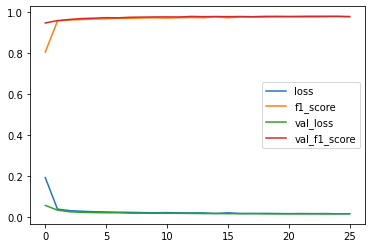

In [ ]:
#u_net_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
u_net_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tfa.losses.SigmoidFocalCrossEntropy(), metrics= [tfa.metrics.F1Score(num_classes=1, average='micro', threshold=0.5)])


# Define callbacks
callbacks = [
        tf.keras.callbacks.ModelCheckpoint('/tmp/Model/U-Net_model_SigmoidFocalCrossEntropy_IG.h5', verbose=1, save_best_only=True),     
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        #tf.keras.callbacks.TensorBoard(log_dir='logs')
       ]

# Fit the model
u_net_model.fit(train_generator, validation_data = (validation_matrix_IG, validation_matrix_GT_IG), epochs = 50, verbose =1, steps_per_epoch= len(train_list) // batch_size, callbacks = callbacks)

# check out the metrics...
performance = pd.DataFrame(u_net_model.history.history)
performance.plot()

### Predictions

In [ ]:
u_net_model = keras.models.load_model('/tmp/Model/U-Net_model_SigmoidFocalCrossEntropy_IG.h5')
print("Evaluate the Image Generator in the case of the U-Net")
results = u_net_model.evaluate(validation_matrix_IG, validation_matrix_GT_IG, batch_size=1)
print("test loss, test f1:", results)

Evaluate the Image Generator in the case of the U-Net


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


42/42 [==============================] - 1s 6ms/step - loss: 0.0148 - f1_score: 0.9794
test loss, test f1: [0.014781726524233818, 0.9793873429298401]


**Training Data**

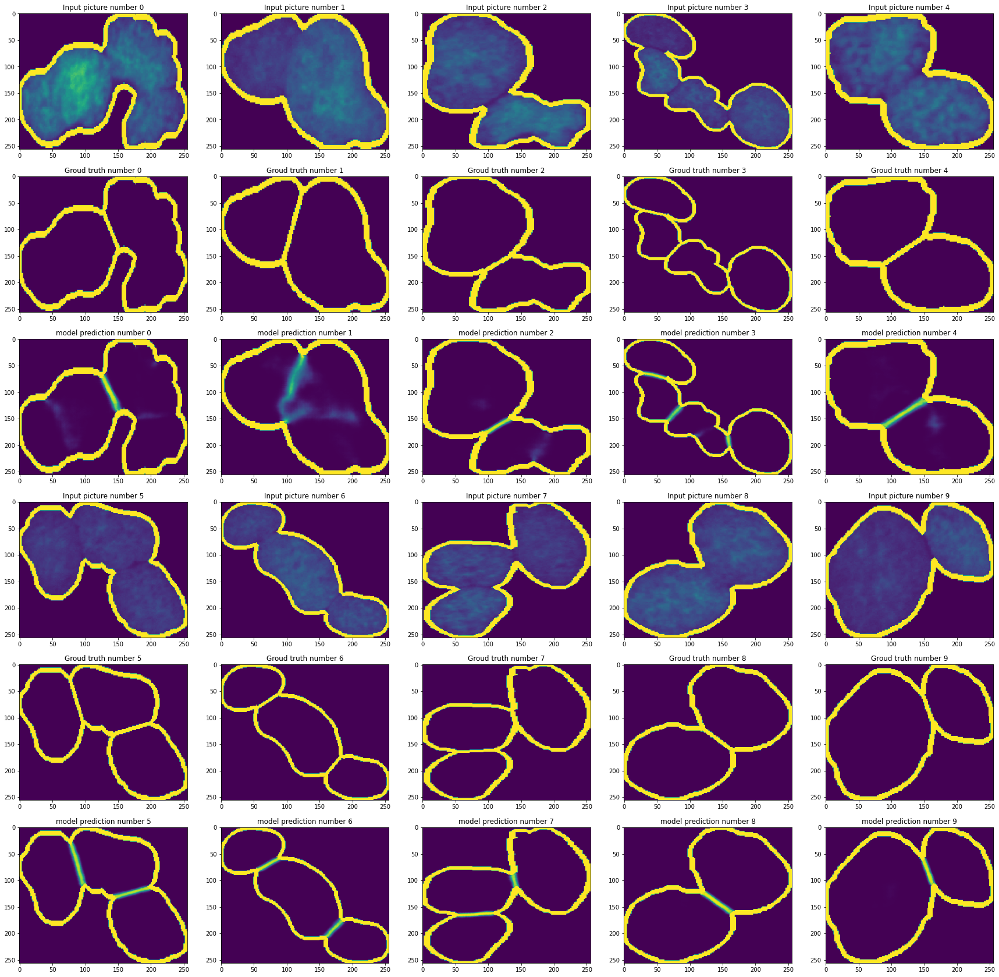

In [ ]:
number_of_pic = 10
img_raw = validation_matrix_IG 
img_mask = validation_matrix_GT_IG
random_number = np.random.randint(img_raw.shape[0]-number_of_pic)
predict_values(img_raw[random_number:random_number+number_of_pic], img_mask[random_number:random_number+number_of_pic], u_net_model)

**Vailidation Data**

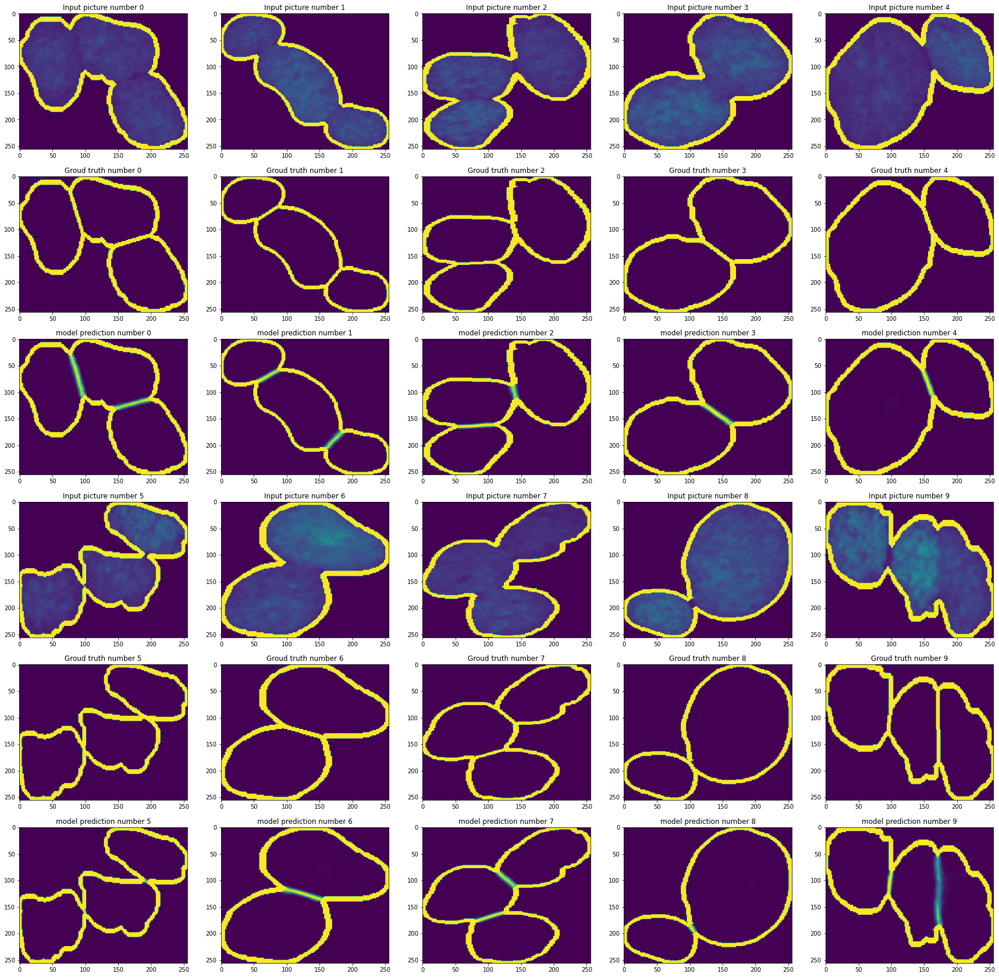

In [ ]:
number_of_pic = 10
random_number = np.random.randint(valid_matrix.shape[0]-number_of_pic)
predict_values(validation_matrix_IG[random_number:random_number+number_of_pic], validation_matrix_GT_IG[random_number:random_number+number_of_pic], u_net_model)

In order o see the Image Generator in context of the U-Net and the adjusted Ground Truth, please take a look into our notebook „Final Model“.

## ResNet50 - transfer learining

Since the ResNet50 model use 3 channel images as an input, we need to modify our Image Generator. In chapter 2 the 3 channel input data was handled in a way that the 1 channel matrix was extended via copies as a 3-channel image.

R = G = B 

In the case of the current implementation Image Generator such an approach couldn’t be executed yet. Even though the data set could be load as a 3 channel input data by changing the color_mode argument of the flow_from_directory() method, this adaptation would not handle the gray scaled image in the same way as the approach out of chapter 2. 





In [ ]:
#Image_Generator for training with suitable imput shape vor the ResNet50 
batch_size = 32
image_size = 256

data_gen_args = dict(rescale= 1/255,
                     horizontal_flip=True,
                     vertical_flip=True,
                     #rotation_range=90,
                     #width_shift_range=0.1,
                     #height_shift_range=0.1,
                     #zoom_range=0.2,
                     fill_mode = 'constant')
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

seed = 1
image_generator = image_datagen.flow_from_directory(
    '/tmp/IG_data/train_raw',
    batch_size = batch_size,
    class_mode=None,
    target_size = (image_size, image_size),
    color_mode="rgb",
    seed=seed)
mask_generator = mask_datagen.flow_from_directory(
    '/tmp/IG_data/train_solutions',
    batch_size = batch_size,
    class_mode=None,
    target_size = (image_size, image_size),
    color_mode="grayscale",
    seed=seed)

train_generator = zip(image_generator, mask_generator)

Found 555 images belonging to 1 classes.
Found 555 images belonging to 1 classes.


In [ ]:
img = image_generator.next()    
im = np.squeeze(img[0])
tt = im.flatten()
print(tt.shape)
a = np.split(tt, 3)
a = np.vstack(a)
print(a.shape)
print(np.array_equal(a[0], a[1]))

(196608,)
(3, 65536)
False


In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50
strategy = tf.distribute.MirroredStrategy()
with strategy.scope():
  ResNet50_model = ResNet50(include_top = False, input_shape = (256,256,3))
  upsample_model = upsampling_model()
  Pre_trained_model_IG = tf.keras.Sequential([ResNet50_model, upsample_model])
  Pre_trained_model_IG.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss=tfa.losses.SigmoidFocalCrossEntropy(), metrics=[tfa.metrics.F1Score(num_classes=1, average='micro', threshold=0.5)])

ResNet50_model.trainable = False
Pre_trained_model_IG.summary()

name = "Pre_trained_model_IG"
callbacks = [
        tf.keras.callbacks.ModelCheckpoint('/tmp/'+ name + '.h5', verbose=0, save_best_only=True),
        tf.keras.callbacks.EarlyStopping(patience=25, monitor='loss'),
        ]
# Fit the model
results = Pre_trained_model_IG.fit(train_generator, validation_data = (np.repeat(validation_matrix_IG,3,-1), validation_matrix_GT_IG),
                        steps_per_epoch= len(train_list) // batch_size, epochs=1000, callbacks=callbacks, verbose = 1)
# check out the metrics
performance = pd.DataFrame(Pre_trained_model_IG.history.history)
performance.plot()

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 8, 8, 2048)        23587712  
_________________________________________________________________
model_2 (Functional)         (None, 256, 256, 1)       15408127  
Total params: 38,995,839
Trainable params: 15,408,127
Non-trainable params: 23,587,712
_________________________________________________________________
Epoch 1/1000
17/17 [==============================] - ETA: 0s - loss: 0.0602 - f1_score: 0.0736

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


17/17 [==============================] - 73s 1s/step - loss: 0.0602 - f1_score: 0.0736 - val_loss: 0.0391 - val_f1_score: 0.0000e+00


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/1000
17/17 [==============================] - 20s 1s/step - loss: 0.0320 - f1_score: 0.0000e+00 - val_loss: 0.0554 - val_f1_score: 0.0000e+00
Epoch 3/1000
17/17 [==============================] - 17s 998ms/step - loss: 0.0272 - f1_score: 0.0000e+00 - val_loss: 0.0763 - val_f1_score: 0.0000e+00
Epoch 4/1000
17/17 [==============================] - 17s 989ms/step - loss: 0.0247 - f1_score: 0.0000e+00 - val_loss: 0.0662 - val_f1_score: 0.0000e+00
Epoch 5/1000
17/17 [==============================] - 17s 977ms/step - loss: 0.0235 - f1_score: 0.0000e+00 - val_loss: 0.1515 - val_f1_score: 0.0000e+00
Epoch 6/1000
17/17 [==============================] - 17s 977ms/step - loss: 0.0222 - f1_score: 0.0000e+00 - val_loss: 0.0564 - val_f1_score: 0.0000e+00
Epoch 7/1000
17/17 [==============================] - 17s 981ms/step - loss: 0.0215 - f1_score: 0.0088 - val_loss: 0.2407 - val_f1_score: 0.0000e+00
Epoch 8/1000
17/17 [==============================] - 17s 986ms/step - loss: 0.0208 - f1_

###Prediction

**Note**

Due to the high file size in case of the RestNet50, we were not able to offer you the option of just loading the model as in the case of the U-Net. Please execute the training of the ResNet50 by yourself. 


In [ ]:
#Load the trained model
#Pre_trained_model_IG = tf.keras.models.load_model('/tmp/Model/Pre_trained_model_IG.h5')
#print("Validation of the Pretrained model with augmentation:")
#results = Pre_trained_model_IG.evaluate(np.repeat(validation_matrix_IG,3,-1), validation_matrix_GT_IG, batch_size=1, verbose = 0)
#print(f"validation loss:{results[0]:.3f}, validation F1-Score:{results[1]:.2f}")

Validation of the Pretrained model with augmentation:


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


validation loss:0.005, validation F1-Score:0.93


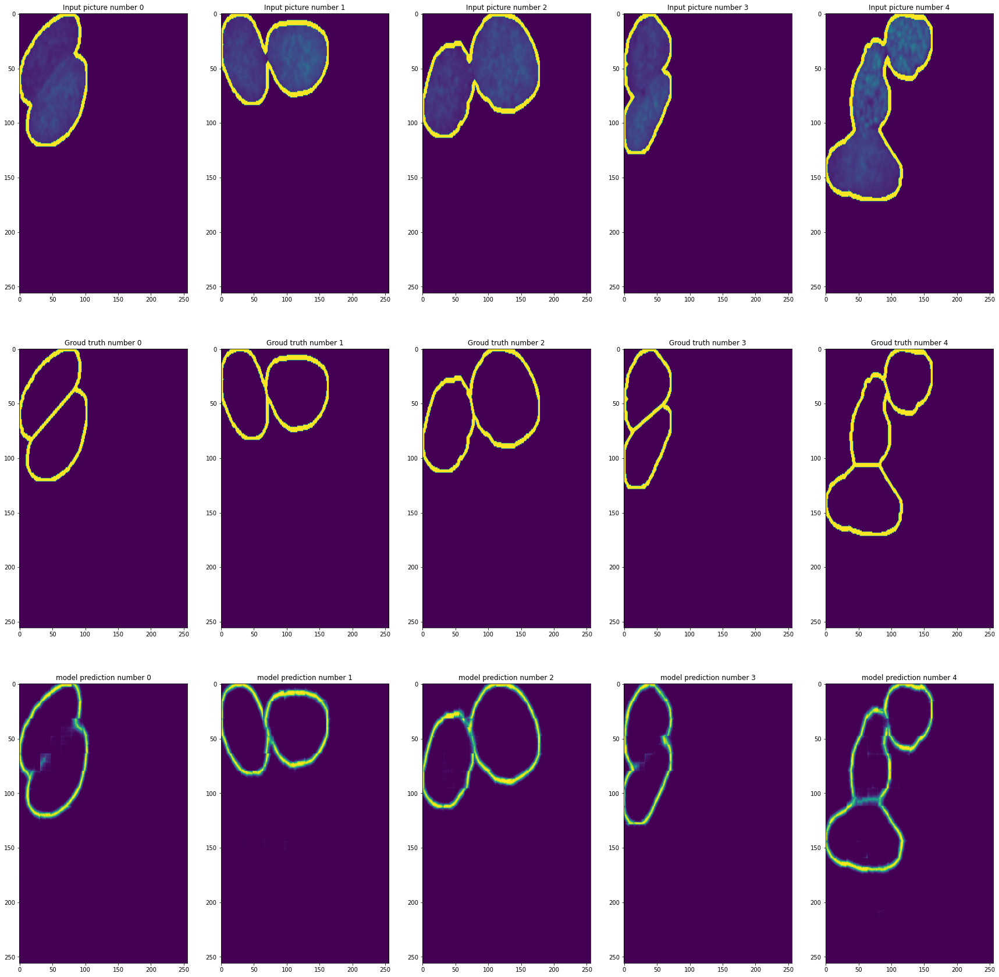

In [ ]:
number_of_pic = 5
random_number = np.random.randint(train_matrix.shape[0]-number_of_pic)
predict_values(np.repeat(train_matrix[random_number:random_number+number_of_pic],3,-1), train_matrix_ground_truth[random_number:random_number+number_of_pic], Pre_trained_model_IG)

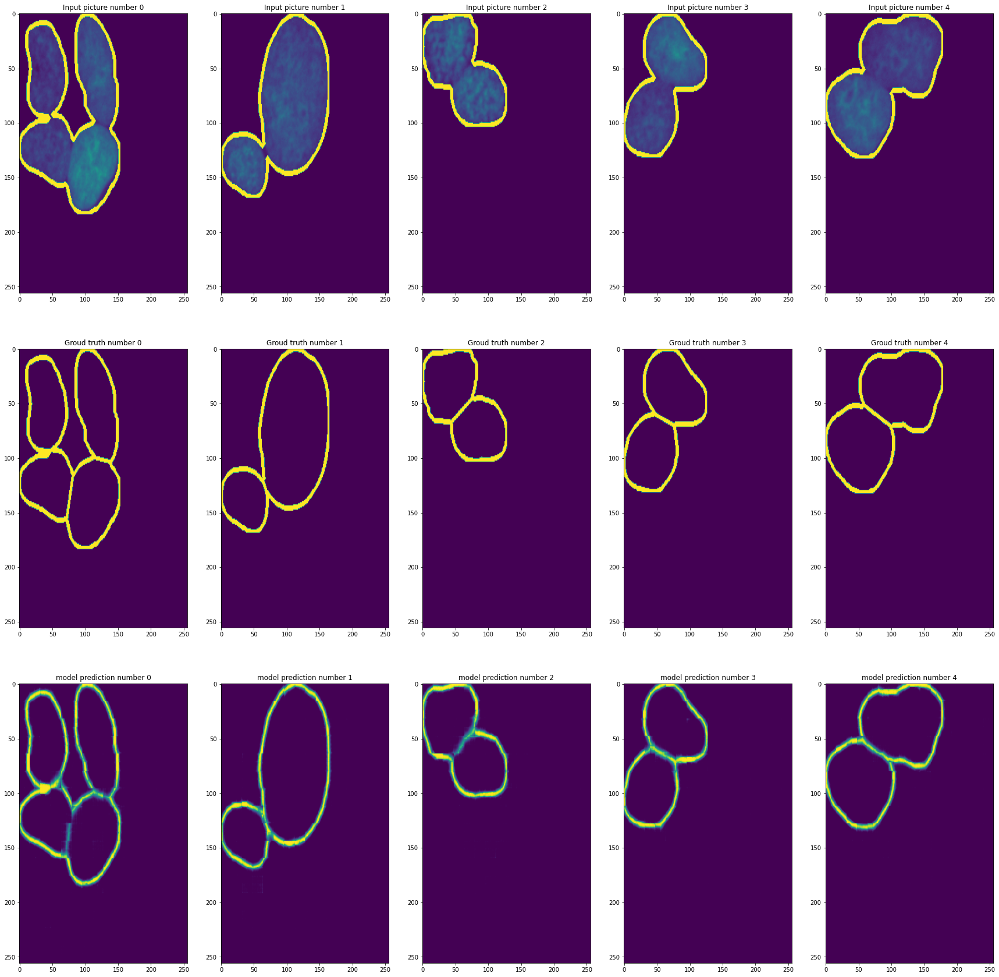

In [ ]:
number_of_pic = 5
random_number = np.random.randint(valid_matrix.shape[0]-number_of_pic)
predict_values(np.repeat(valid_matrix[random_number:random_number+number_of_pic],3,-1), valid_matrix_ground_truth[random_number:random_number+number_of_pic], Pre_trained_model_IG)

###Fine tuning

In [ ]:
#Image_Generator for training with suitable imput shape vor the ResNet50 
batch_size = 32
image_size = 256

data_gen_args = dict(rescale= 1/255,
                     horizontal_flip=True,
                     vertical_flip=True,
                     #rotation_range=90,
                     #width_shift_range=0.1,
                     #height_shift_range=0.1,
                     #zoom_range=0.2,
                     fill_mode = 'constant')
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

seed = 1
image_generator = image_datagen.flow_from_directory(
    '/tmp/IG_data/train_raw',
    batch_size = batch_size,
    class_mode=None,
    target_size = (image_size, image_size),
    color_mode="rgb",
    seed=seed)
mask_generator = mask_datagen.flow_from_directory(
    '/tmp/IG_data/train_solutions',
    batch_size = batch_size,
    class_mode=None,
    target_size = (image_size, image_size),
    color_mode="grayscale",
    seed=seed)

train_generator = zip(image_generator, mask_generator)

In [ ]:
strategy = tf.distribute.MirroredStrategy()
ResNet50_model.trainable = True

with strategy.scope():
  if 1:
  Fine_tuned_model_IG = tf.keras.models.load_model('/tmp/Pretrained_model.h5')
  #Fine_tuned_model_IG = tf.keras.models.load_model('/content/drive/MyDrive/kaggle/Model/Pretrained_model.h5')
  Fine_tuned_model_IG.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-6), loss=tfa.losses.SigmoidFocalCrossEntropy(), metrics=[tfa.metrics.F1Score(num_classes=1, average='micro', threshold=0.5)])

Fine_tuned_model_IG.summary()
name = "Fine_tuned_model_IG"
callbacks = [
        tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/kaggle/Model/'+ name + '.h5', verbose=1, save_best_only=True),
        #tf.keras.callbacks.ModelCheckpoint('/content/drive/MyDrive/kaggle/Model/'+ name + '.h5', verbose=1, save_best_only=True),
        tf.keras.callbacks.EarlyStopping(patience=25, monitor='val_loss'),
        #tf.keras.callbacks.TensorBoard(log_dir='logs')
        ]

# Fit the model
results = Fine_tuned_model_IG.fit(train_generator, validation_data = (np.repeat(validation_matrix_IG,3,-1), validation_matrix_GT_IG),
                        steps_per_epoch= len(train_list) // batch_size, epochs=1000, callbacks=callbacks)
# check out the metrics...
performance = pd.DataFrame(Fine_tuned_model_IG.history.history)
performance.plot()

###Prediction

**Note**

Due to the high file size in case of the RestNet50, we were not able to offer you the option of just loading the model as in the case of the U-Net. Please execute the training of the ResNet50 by yourself.

In [ ]:
#Load the trained model
#Fine_tuned_model_IG = tf.keras.models.load_model('/tmp/Model/Fine_tuned_model_IG.h5')
#Fine_tuned_model_IG = tf.keras.models.load_model('/content/drive/MyDrive/kaggle/Model/Fine_tuned_model_IG.h5')
#print("Validation of the Pretrained model with augmentation:")
#results = Fine_tuned_model_IG.evaluate(np.repeat(validation_matrix_IG,3,-1), validation_matrix_GT_IG, batch_size=1, verbose = 0)
#print(f"validation loss:{results[0]:.3f}, validation F1-Score:{results[1]:.2f}")

Validation of the Pretrained model with augmentation:


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


validation loss:0.034, validation F1-Score:0.06


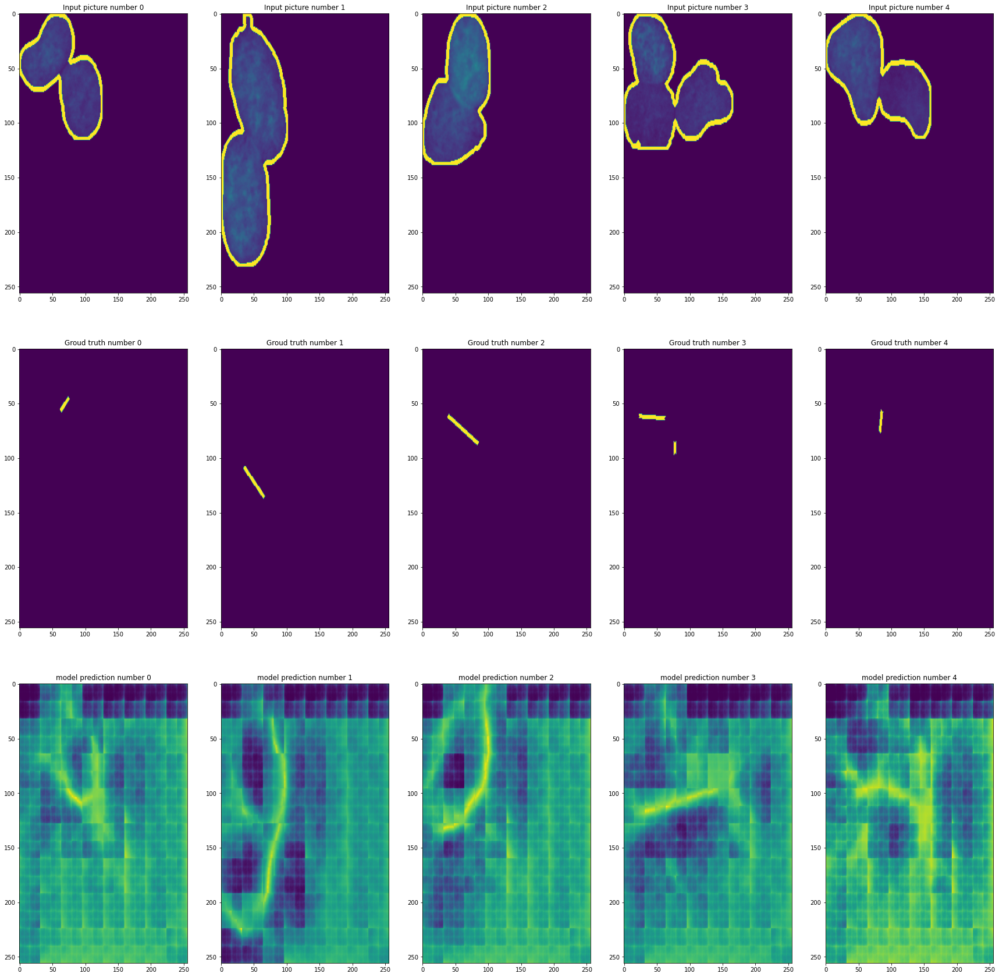

In [ ]:
number_of_pic = 5
random_number = np.random.randint(train_matrix.shape[0]-number_of_pic)
predict_values(np.repeat(train_matrix[random_number:random_number+number_of_pic],3,-1), train_matrix_ground_truth[random_number:random_number+number_of_pic], Fine_tuned_model_IG)

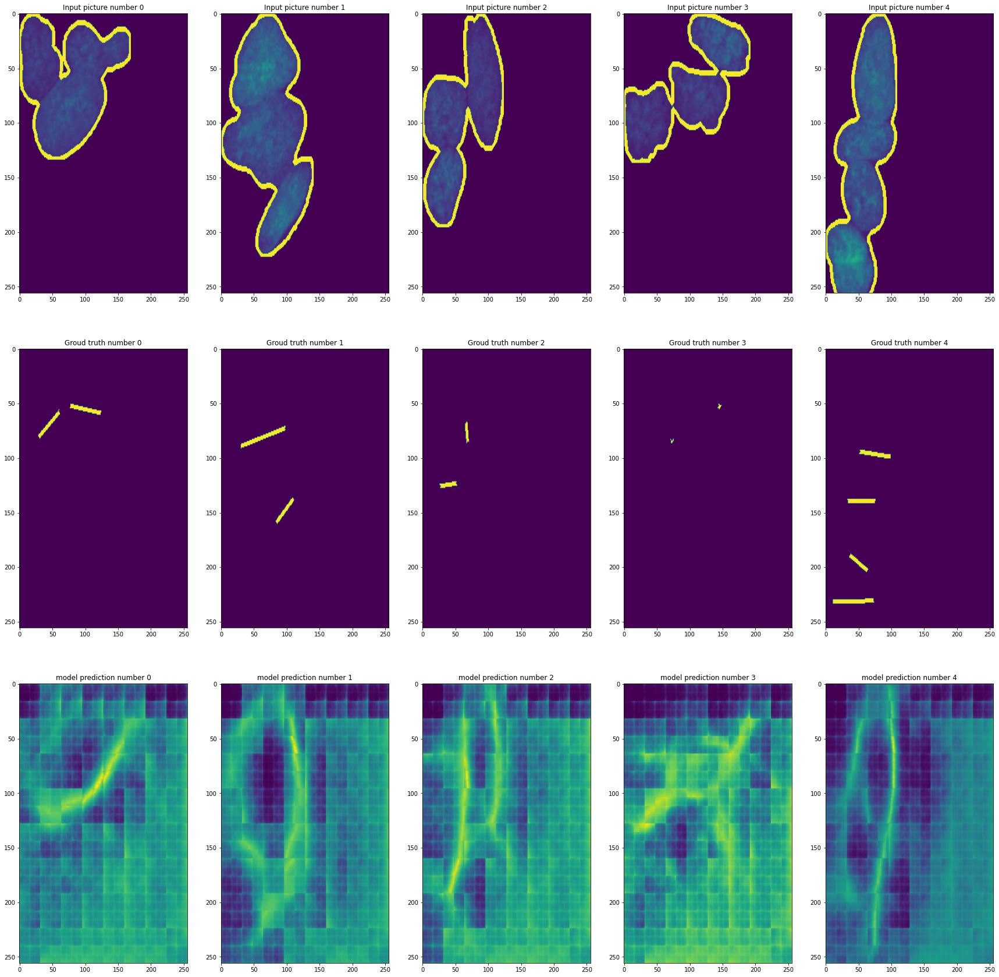

In [ ]:
number_of_pic = 5
random_number = np.random.randint(valid_matrix.shape[0]-number_of_pic)
predict_values(np.repeat(valid_matrix[random_number:random_number+number_of_pic],3,-1), valid_matrix_ground_truth[random_number:random_number+number_of_pic], Fine_tuned_model_IG)